# VGG19CNN Model : Normalized Images and Applied Masked

The goal of this project is to use deep learning to classify X-Ray images of patients into three categories : COVID-19, Pneumonia and Normal.

The model used in this notebook is based on this article : "Deep-chest: Multi-classification deep learning model for diagnosing COVID-19, pneumonia, and lung cancer chest diseases" de Ibrahim M. D. et al.

## IMPORT

In [1]:
import numpy as np
import pandas as pd
import cv2
import os
from tqdm import tqdm
from PIL import Image
import shutil

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report

import matplotlib.pyplot as plt
import seaborn as sns

import random
import optuna
import torch
import subprocess
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from torch.optim import Adam
from torchvision import datasets, transforms
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from optuna.integration import PyTorchLightningPruningCallback
import pytorch_lightning as pl
from pytorch_lightning import LightningModule, Trainer
import lightning as L
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

c:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## CHECK CUDA AVAILIBILITY

In [2]:
# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print(f"CUDA available: {cuda_available}")

if cuda_available:
    # Print CUDA device details
    print(f"CUDA device count: {torch.cuda.device_count()}")
    for i in range(torch.cuda.device_count()):
        print(f"Device {i}: {torch.cuda.get_device_name(i)}")
else:
    print("CUDA is not available. Checking system details...")

# Check NVIDIA driver
try:
    nvidia_smi_output = subprocess.check_output(["nvidia-smi"], universal_newlines=True)
    print("NVIDIA-SMI output:")
    print(nvidia_smi_output)
except FileNotFoundError:
    print("NVIDIA-SMI not found. Please ensure NVIDIA drivers are installed.")

# Check nvcc
try:
    nvcc_version = subprocess.check_output(["nvcc", "--version"], universal_newlines=True)
    print("nvcc version:")
    print(nvcc_version)
except FileNotFoundError:
    print("nvcc not found. Please ensure CUDA toolkit is installed and nvcc is in your PATH.")

CUDA available: True
CUDA device count: 1
Device 0: NVIDIA GeForce GTX 1070
NVIDIA-SMI output:
Thu May 16 16:21:47 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 552.44                 Driver Version: 552.44         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1070      WDDM  |   00000000:01:00.0  On |                  N/A |
|  0%   55C    P0             37W /  250W |     846MiB /   8192MiB |      5%      Default |
|                                         |  

In [3]:
print(torch.__version__)
print(torch.version.cuda)

2.3.0+cu121
12.1


## VARIABLES

In [4]:
groups = ['COVID-19', 'Normal', 'Non-COVID']
sets = ['Val', 'Test', 'Train']

# Colab
# base_path = '/content/covidqu_data/Lung Segmentation Data/Lung Segmentation Data'
# destination_path = '/content/working/COVID-EX-Qu-dataset'

# Kaggle
dataset_path = r'C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\Lung Segmentation Data\Lung Segmentation Data'
working_path = r'C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet'
source_images_path = os.path.join(working_path, 'source')

# Structure pour le modele
images_path = os.path.join(working_path, 'model','images')
clahe_images_path = os.path.join(working_path, 'model','normalized_images')
masked_normalized_images_path = os.path.join(working_path, 'model', 'masked_normalized_images')

## 1. Data structure and settings

### 1.1 Copying source images and lung masks from the kaggle dataset

In [10]:
def copy_images(base_path, destination_path, sets, groups, folders, replace=False):
    """
    Copies image directories from a base path to a destination path for specified sets and groups.

    Args:
        base_path (str): The base directory containing image data organized by sets and groups.
        destination_path (str): The target directory where image data will be copied.
        sets (list): A list of sets, e.g., ['Val', 'Test', 'Train'].
        groups (list): A list of groups, e.g., ['COVID-19', 'Normal', 'Non-COVID'].
        folders (list): A list of image types inside 'groups' folders, e.g., ['images', 'lung masks'].
        replace (bool): If True, existing directories at the destination will be replaced.

    If the destination directory already exists and replace is False,
    the function prints a message indicating that the directory exists and skips the copying process.
    """
    for sett in sets:
        
        for group in groups:
            image_dir = os.path.join(base_path, sett, group)
            
            for folder in folders:
                source_path = os.path.join(image_dir, folder)
                destination_dir = os.path.join(destination_path, sett, group, folder)
                
                if os.path.exists(destination_dir):
                    if replace:
                        shutil.rmtree(destination_dir)
                        shutil.copytree(source_path, destination_dir)
                        print(f"Replaced the directory {destination_dir}")
                    else:
                        print(f"The directory {destination_dir} already exists.")
                else:
                    shutil.copytree(source_path, destination_dir)
                    print(f"Copied to {destination_dir}")

In [11]:
copy_images(
    base_path=dataset_path, 
    destination_path=source_images_path, 
    sets=sets, 
    groups=groups, 
    folders=['images', 'lung masks'],
    replace=False
)

Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Val\COVID-19\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Val\COVID-19\lung masks
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Val\Normal\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Val\Normal\lung masks
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Val\Non-COVID\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Val\Non-COVID\lung masks
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Test\COVID-19\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\source\Test\COVID-19\lung masks
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_

In [12]:
def check_data_integrity(destination_path, sets, groups, ref_covid, ref_noncovid, ref_normal):
    """
    Checks the integrity of data by counting the number of images in each category
    and comparing them to reference values. Displays three random images from each set and group in grayscale,
    with all text outputs printed after image displays.

    Args:
        destination_path (str): The directory where image data has been copied.
        sets (list): A list of sets, e.g., ['Val', 'Test', 'Train'].
        groups (list): A list of groups, e.g., ['COVID-19', 'Normal', 'Non-COVID'].
        ref_covid (int): Reference number of COVID-19 images.
        ref_noncovid (int): Reference number of Non-COVID images.
        ref_normal (int): Reference number of Normal images.
    """
    n_covid = 0
    n_noncovid = 0
    n_normal = 0
    outputs = []

    for sett in sets:
        for group in groups:
            ima_dir = os.path.join(destination_path, sett, group, 'images')
            image_files = os.listdir(ima_dir)
            num_images = len(image_files)
            outputs.append(f"In the set {sett}, there are {num_images} images of {group}")

            if num_images > 0:
                # Randomly select 3 images to display, or fewer if there are less than 3.
                sample_images = random.sample(image_files, min(3, num_images))

                # Displaying the images using matplotlib
                fig, axes = plt.subplots(1, min(3, num_images), figsize=(15, 5))
                for idx, img_name in enumerate(sample_images):
                    img_path = os.path.join(ima_dir, img_name)
                    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                    axes[idx].imshow(img, cmap='gray')
                    axes[idx].axis('off')
                    axes[idx].set_title(f"{group} ({sett})")
                plt.show()

            if group == "COVID-19":
                n_covid += num_images
            elif group == "Non-COVID":
                n_noncovid += num_images
            elif group == "Normal":
                n_normal += num_images

    outputs.append(f"\nThere are {n_covid} COVID images found, {n_covid / ref_covid * 100:.2f}% of the original dataset from Kaggle.")
    outputs.append(f"There are {n_noncovid} non-COVID images, {n_noncovid / ref_noncovid * 100:.2f}% of the original dataset from Kaggle.")
    outputs.append(f"There are {n_normal} normal images, {n_normal / ref_normal * 100:.2f}% of the original dataset from Kaggle.")

    for output in outputs:
        print(output)

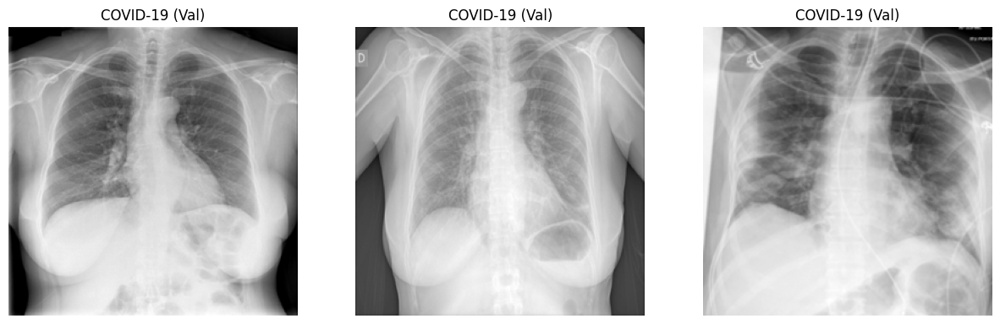

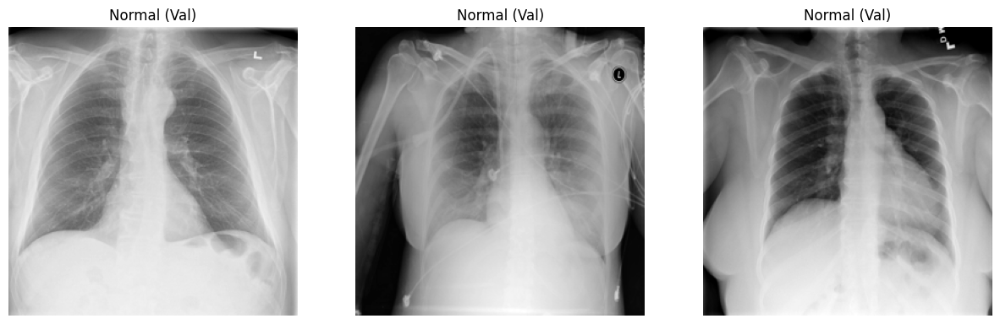

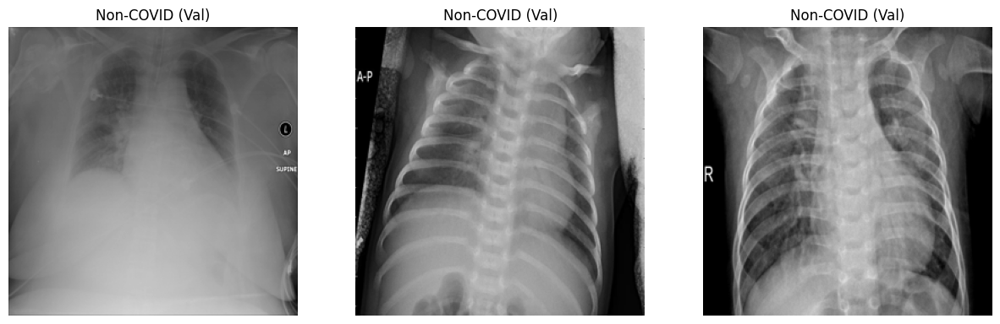

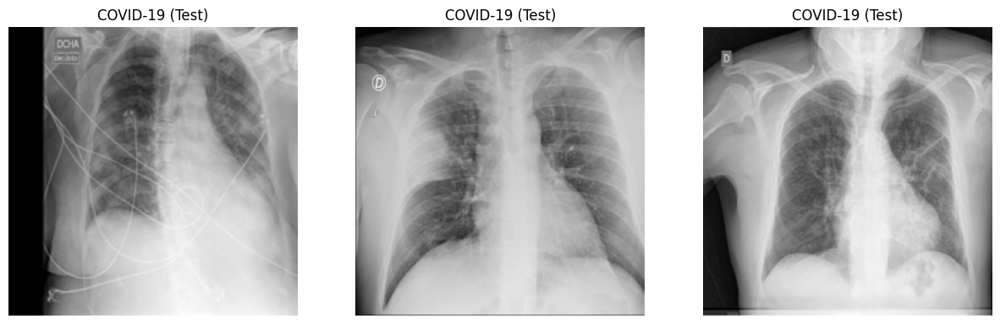

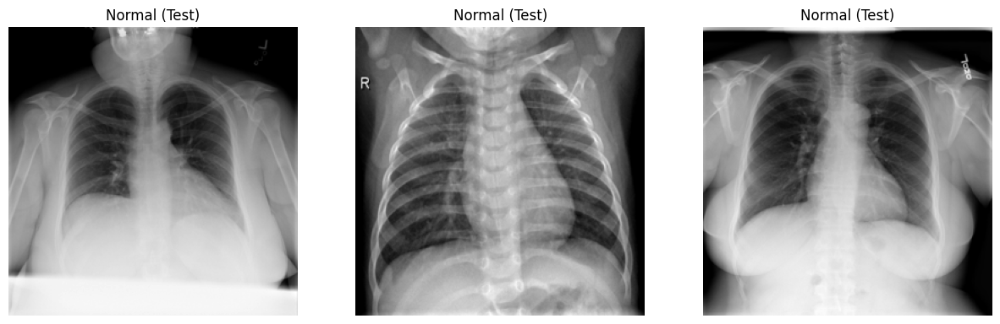

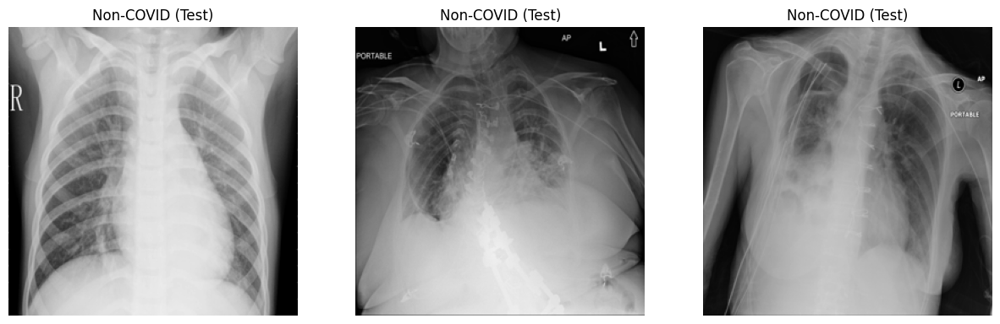

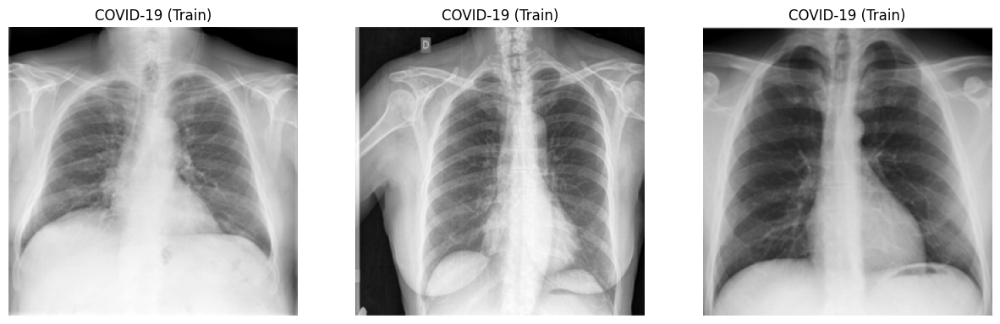

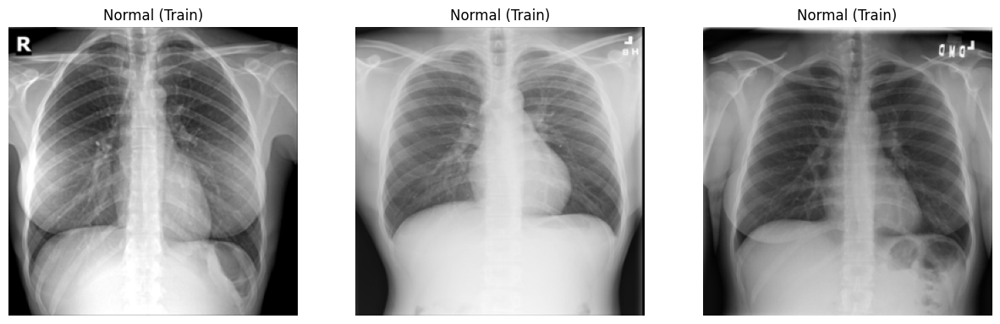

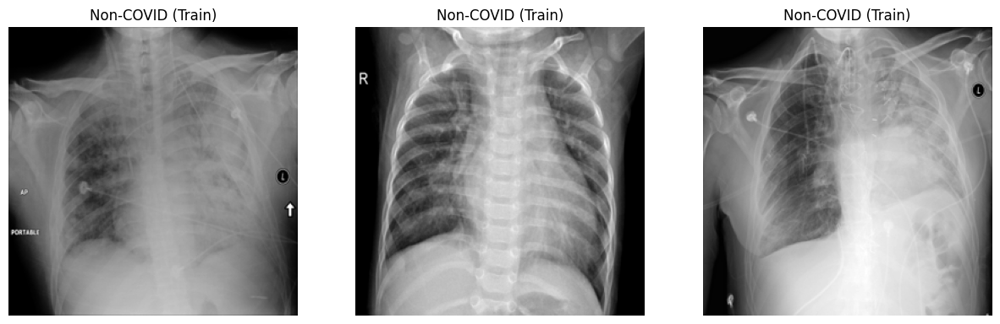

In the set Val, there are 1903 images of COVID-19
In the set Val, there are 1712 images of Normal
In the set Val, there are 1802 images of Non-COVID
In the set Test, there are 2395 images of COVID-19
In the set Test, there are 2140 images of Normal
In the set Test, there are 2253 images of Non-COVID
In the set Train, there are 7658 images of COVID-19
In the set Train, there are 6849 images of Normal
In the set Train, there are 7208 images of Non-COVID

There are 11956 COVID images found, 100.00% of the original dataset from Kaggle.
There are 11263 non-COVID images, 100.00% of the original dataset from Kaggle.
There are 10701 normal images, 100.00% of the original dataset from Kaggle.


In [13]:
check_data_integrity(destination_path=source_images_path, sets=sets, groups=groups, ref_covid=11956, ref_noncovid=11263, ref_normal=10701)

### 1.2 Data folders structure for the model

A specific data structure is expected for the model : 1 folder per set (Val, Test and Train) et one sub-folder per group which hold all the images. We have to replicate this arborescence for the images and the masked images.

#### 1.2.1 Raw images

In [14]:
copy_images(
    base_path=source_images_path , 
    destination_path=images_path, 
    sets=sets, 
    groups=groups, 
    folders=['images'],
    replace=False)

Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Val\COVID-19\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Val\Normal\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Val\Non-COVID\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Test\COVID-19\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Test\Normal\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Test\Non-COVID\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Train\COVID-19\images
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\images\Train\Normal\images
Copied to C:\Users\Ni

#### 1.2.2 CLAHE Normalized Images

We apply the CLAHE (an equalized histogram normalization) on images in 'images_path' and save the results in 'clahe_images_path'.

In [15]:
def apply_clahe_normalization(img):
    """
    Apply CLAHE normalization to an input image.

    Args:
        img (numpy.ndarray): Input image, either in grayscale or RGB format.

    Returns:
        numpy.ndarray: CLAHE normalized image.

    Raises:
        ValueError: If the input image is None or not a valid image.
    """
    if img is None:
        raise ValueError("No image data received!")

    if not isinstance(img, np.ndarray):
        raise ValueError("Input must be a numpy.ndarray")

    # Convert image to grayscale if it's not already
    if len(img.shape) == 3 and img.shape[2] == 3:  # RGB image
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    elif len(img.shape) != 2:  # Not a grayscale or RGB image
        raise ValueError("Input image must be either grayscale or RGB")

    # Ensure image is of type uint8 (required for CLAHE)
    if img.dtype != np.uint8:
        img = img.astype('uint8')

    # Apply CLAHE transformation
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img = clahe.apply(img)

    return img

In [16]:
def copy_and_clahe_images(base_path, destination_path, sets, groups, folders, replace=False):
    """
    Copy and apply CLAHE normalization on image directories from a base path to a destination path for specified sets and groups.

    Args:
        base_path (str): The base directory containing image data organized by sets and groups.
        destination_path (str): The target directory where image data will be copied.
        sets (list): A list of sets, e.g., ['Val', 'Test', 'Train'].
        groups (list): A list of groups, e.g., ['COVID-19', 'Normal', 'Non-COVID'].
        folders (list): A list of image types inside 'groups' folders, e.g., ['images', 'lung masks'].
        replace (bool): If True, existing directories at the destination will be replaced.

    If the destination directory already exists and replace is False,
    the function prints a message indicating that the directory exists and skips the copying process.
    """
    for sett in sets:
        for group in groups:
            for folder in folders:
                base_dir = os.path.join(base_path, sett, group, folder)
                destination_dir = os.path.join(destination_path, sett, group, folder)
                
                if os.path.exists(destination_dir):
                    if replace:
                        shutil.rmtree(destination_dir)
                        os.makedirs(destination_dir)
                        print(f"Replaced the directory {destination_dir}")
                    else:
                        print(f"The directory {destination_dir} already exists.")
                        continue
                else:
                    os.makedirs(destination_dir)
                    print(f"Copied to {destination_dir}")
                
                # Process each image file individually
                for filename in tqdm(os.listdir(base_dir)):
                    base_file_path = os.path.join(base_dir, filename)
                    destination_file_path = os.path.join(destination_dir, filename)
                    
                    # Read the image
                    img = cv2.imread(base_file_path, cv2.IMREAD_UNCHANGED)
                    if img is not None:
                        # Apply CLAHE normalization
                        normalized_img = apply_clahe_normalization(img)
                        
                        # Normalize the image to [0, 1]
#                         img = img.astype('float32') / 255.0
                        
                        # Save the normalized image
                        cv2.imwrite(destination_file_path, normalized_img)
                    else:
                        print(f"Failed to read {source_path}")

In [17]:
copy_and_clahe_images(
    base_path=source_images_path ,
    destination_path=clahe_images_path ,
    sets=sets,
    groups=groups,
    folders=['images'],
    replace=False
)

Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Val\COVID-19\images


100%|██████████| 1903/1903 [00:08<00:00, 213.29it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Val\Normal\images


100%|██████████| 1712/1712 [00:08<00:00, 213.02it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Val\Non-COVID\images


100%|██████████| 1802/1802 [00:08<00:00, 200.73it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Test\COVID-19\images


100%|██████████| 2395/2395 [00:11<00:00, 205.53it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Test\Normal\images


100%|██████████| 2140/2140 [00:10<00:00, 207.97it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Test\Non-COVID\images


100%|██████████| 2253/2253 [00:11<00:00, 198.49it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Train\COVID-19\images


100%|██████████| 7658/7658 [00:39<00:00, 194.96it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Train\Normal\images


100%|██████████| 6849/6849 [00:35<00:00, 191.34it/s]


Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\normalized_images\Train\Non-COVID\images


100%|██████████| 7208/7208 [00:36<00:00, 198.52it/s]


#### 1.2.3 Masked CLAHE Normalized Images

We apply masks on the CLAHE normalized images in 'clahe_images_path' and save the results in 'masked_normalized_images_path'.

In [19]:
def apply_black_mask(image, mask):
    """
    Apply a black mask to an image, keeping the content in white areas of the mask.
    
    Args:
        image (numpy.ndarray): The original image.
        mask (numpy.ndarray): The mask image, where white areas will be kept and black areas masked.
    
    Returns:
        numpy.ndarray: The resulting image with the mask applied.
    """
    # Resize the mask to match the dimensions of the image (if necessary)
    if image.shape[:2] != mask.shape[:2]:
        mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

    # Perform bitwise AND operation to keep content in white areas of the mask
    masked_content = cv2.bitwise_and(image, image, mask=mask)

    # Create a black image of the same size as the original image
    black_image = np.zeros_like(image)

    # Perform bitwise AND operation to keep black areas of the mask
    black_areas = cv2.bitwise_and(black_image, black_image, mask=mask)

    # Combine the masked content and black areas using bitwise OR operation
    masked_image = cv2.bitwise_or(masked_content, black_areas)
   
    return masked_image

In [20]:
def dilate_and_apply_black_mask(mask, nb_pixels, image, file, masked_image_path):    
    """
    Apply the apply_black_mask function with a dilated mask and save the resulting image.
    
    Args:
        mask (numpy.ndarray): The mask image.
        nb_pixels (int): The size of the dilation kernel.
        image (numpy.ndarray): The original image.
        file (str): The filename of the original image.
        masked_image_path (str): The path where the resulting image will be saved.
    """
    kernel = np.ones((nb_pixels, nb_pixels), np.uint8)
    dilated_mask = cv2.dilate(mask, kernel)

    masked_image = apply_black_mask(image=image, mask=dilated_mask)
    
    file_name = "masked_" + file
    output_path = os.path.join(masked_image_path, file_name)
    
    cv2.imwrite(output_path, masked_image)
    

In [21]:
def apply_mask(destination_path, sets, groups, replace=False):
    """
    Copy and apply the corresponding mask on image directories from a base path to a destination path for specified sets and groups.

    Args:
        base_path (str): The base directory containing image data organized by sets and groups.
        destination_path (str): The target directory where image data will be copied.
        sets (list): A list of sets, e.g., ['Val', 'Test', 'Train'].
        groups (list): A list of groups, e.g., ['COVID-19', 'Normal', 'Non-COVID'].
        replace (bool): If True, existing directories at the destination will be replaced.

    If the destination directory already exists and replace is False,
    the function prints a message indicating that the directory exists and skips the copying process.
    """
    for sett in sets:
        print(sett)
        for group in groups:
            print(group)
            base_mask_dir = os.path.join(source_images_path , sett, group, 'lung masks')
            base_image_dir = os.path.join(clahe_images_path , sett, group, 'images')
            destination_dir = os.path.join(destination_path, sett, group, 'images')
                
            if os.path.exists(destination_dir):
                if replace:
                    shutil.rmtree(destination_dir)
                    os.makedirs(destination_dir)
                    print(f"Replaced the directory {destination_dir}")
                else:
                    print(f"The directory {destination_dir} already exists.")
                    continue
            else:
                os.makedirs(destination_dir)
                print(f"Copied to {destination_dir}")

            for filename in tqdm(os.listdir(base_mask_dir)):

                base_mask_path = os.path.join(base_mask_dir, filename)
                base_image_path = os.path.join(base_image_dir, filename)
                
                image = cv2.imread(base_image_path, cv2.IMREAD_GRAYSCALE)
                mask = cv2.imread(base_mask_path, cv2.IMREAD_GRAYSCALE)               
                
                if image is None:
                    print("Error: Unable to read image file")
                    print(image_file, "\n",  mask_file)
                    exit()
                elif mask is None:
                    print("Error: Unable to read mask file")
                    print(image_file, "\n",  mask_file)
                    exit()
                    
                dilate_and_apply_black_mask(
                    mask=mask, 
                    nb_pixels=3, 
                    image=image, 
                    file=filename,
                    masked_image_path=destination_dir)

In [22]:
apply_mask(
    destination_path=masked_normalized_images_path , 
    sets=sets, 
    groups=groups, 
    replace=False)

Val
COVID-19
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Val\COVID-19\images


100%|██████████| 1903/1903 [00:29<00:00, 64.11it/s]


Normal
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Val\Normal\images


100%|██████████| 1712/1712 [00:30<00:00, 56.92it/s]


Non-COVID
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Val\Non-COVID\images


100%|██████████| 1802/1802 [00:26<00:00, 67.56it/s]


Test
COVID-19
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Test\COVID-19\images


100%|██████████| 2395/2395 [00:35<00:00, 68.25it/s]


Normal
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Test\Normal\images


100%|██████████| 2140/2140 [00:30<00:00, 70.73it/s]


Non-COVID
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Test\Non-COVID\images


100%|██████████| 2253/2253 [00:31<00:00, 71.31it/s]


Train
COVID-19
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Train\COVID-19\images


100%|██████████| 7658/7658 [01:49<00:00, 70.12it/s]


Normal
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Train\Normal\images


100%|██████████| 6849/6849 [01:36<00:00, 70.76it/s]


Non-COVID
Copied to C:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\model\masked_normalized_images\Train\Non-COVID\images


100%|██████████| 7208/7208 [01:45<00:00, 68.57it/s]


#### 1.2.4 Check processed images

In [23]:
def display_random_images_from_sets(base_path, sets, groups, num_images=3):
    """
    Display random images from each set and group in the specified base path.

    Args:
        base_path (str): The base directory containing the images.
        sets (list): A list of sets, e.g., ['Val', 'Test', 'Train'].
        groups (list): A list of groups, e.g., ['COVID-19', 'Normal', 'Non-COVID'].
        num_images (int): The number of random images to display from each set and group.
    """
    for sett in sets:
        for group in groups:
            image_dir = os.path.join(base_path, sett, group, 'images')
            all_images = os.listdir(image_dir)
            random_images = random.sample(all_images, min(len(all_images), num_images))
            
            plt.figure(figsize=(15, 5))
            plt.suptitle(f"{sett} - {group}", fontsize=16)
            
            for i, image_name in enumerate(random_images):
                image_path = os.path.join(image_dir, image_name)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                plt.subplot(1, num_images, i + 1)
                plt.imshow(image, cmap='gray')
                plt.title(image_name)
                plt.axis('off')
            
            plt.show()

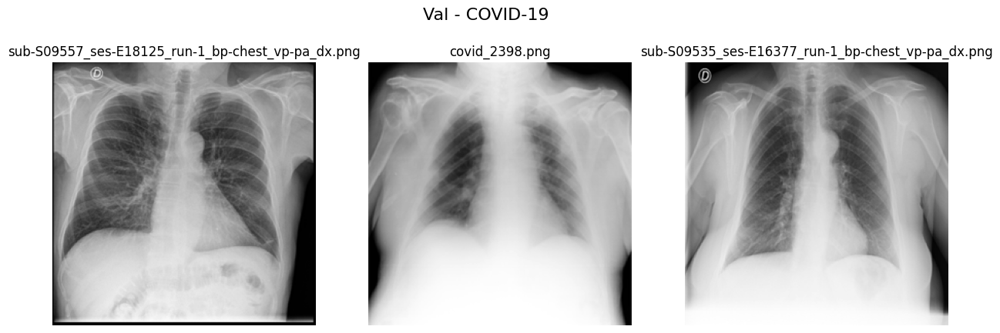

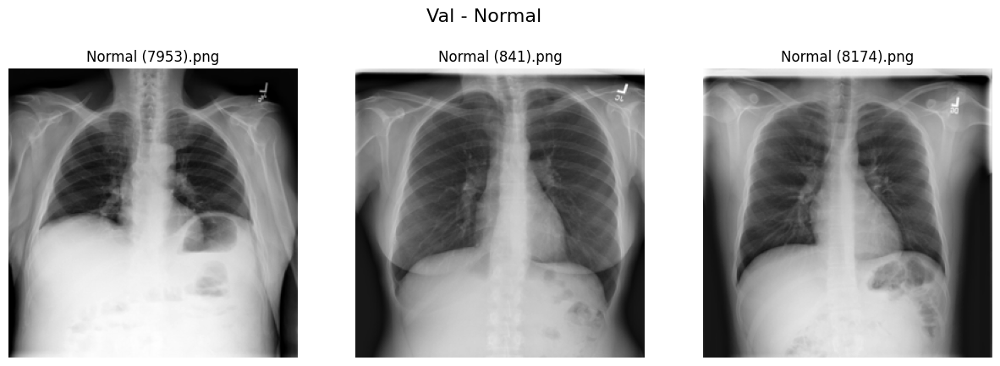

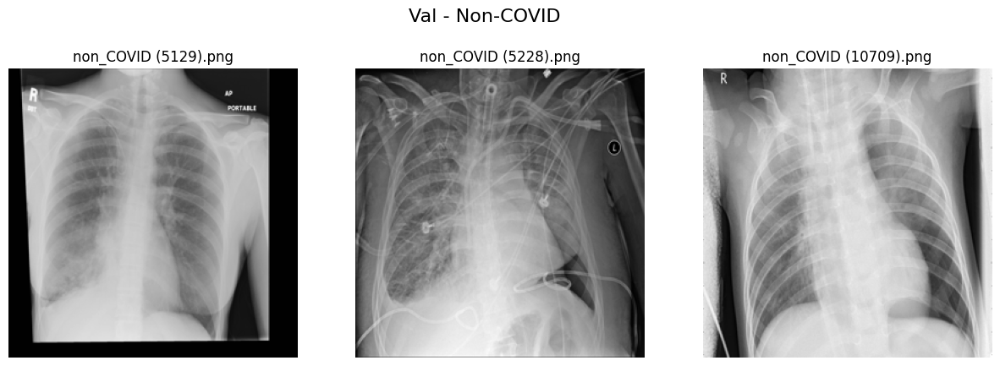

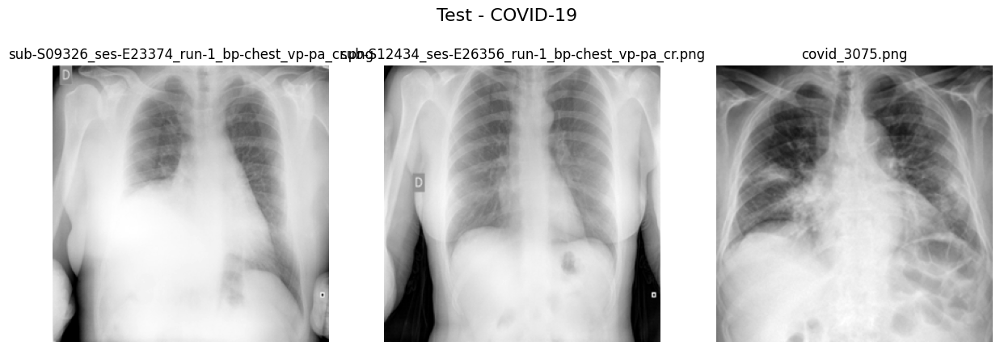

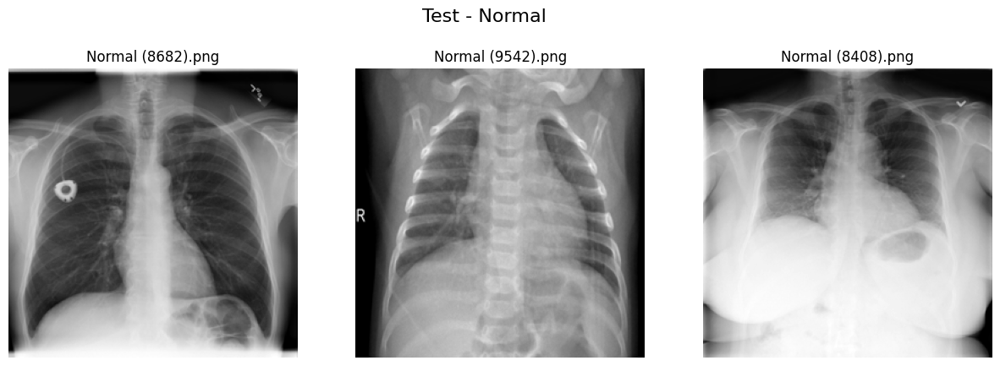

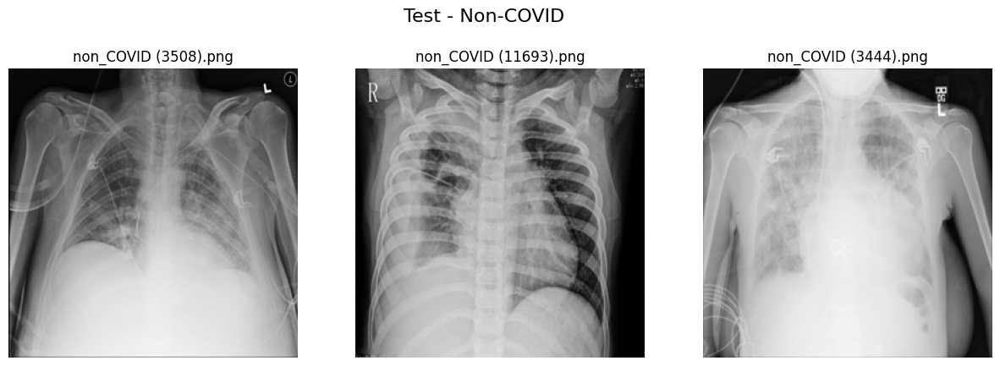

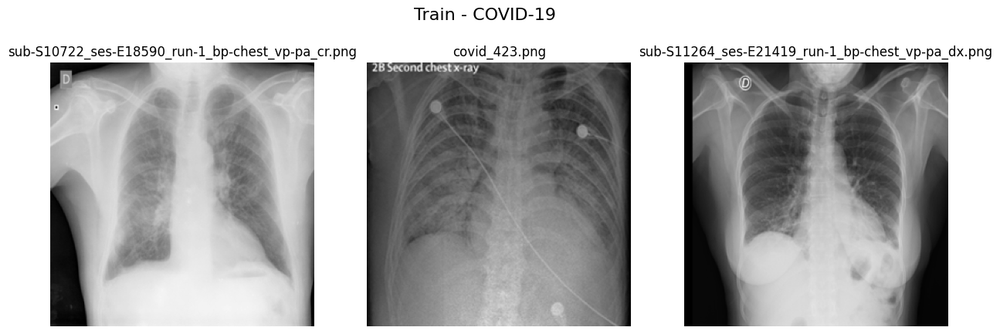

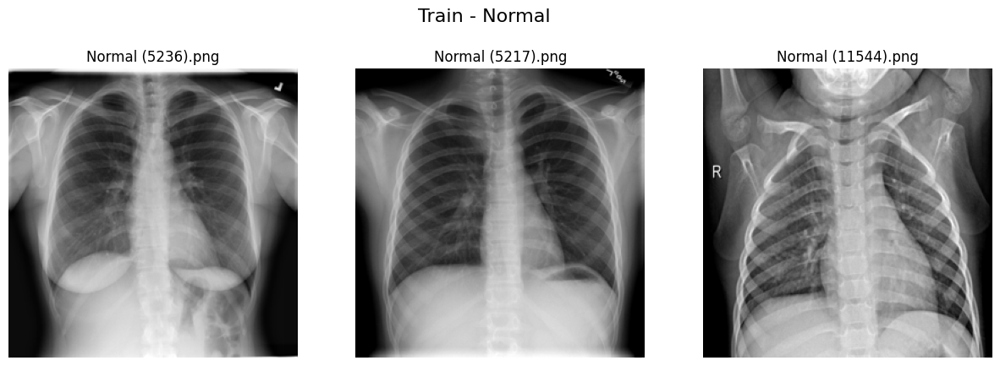

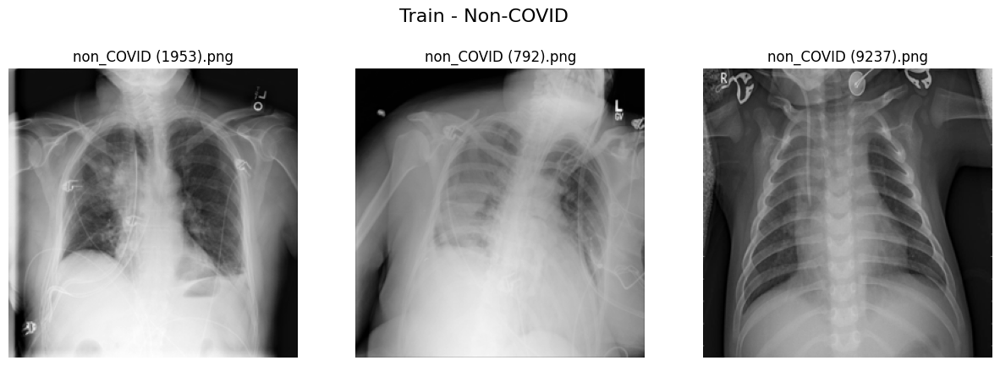

In [24]:
display_random_images_from_sets(base_path=images_path, sets=sets, groups=groups, num_images=3)

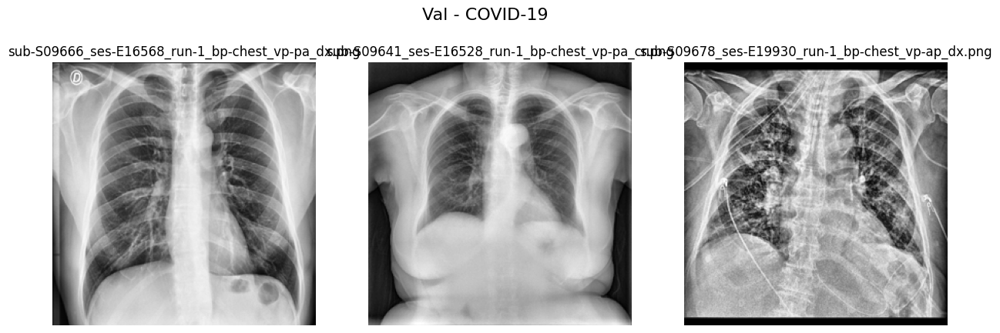

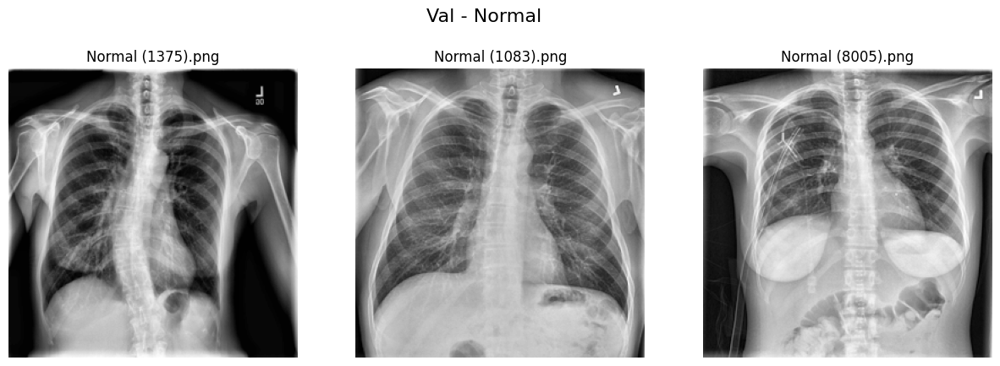

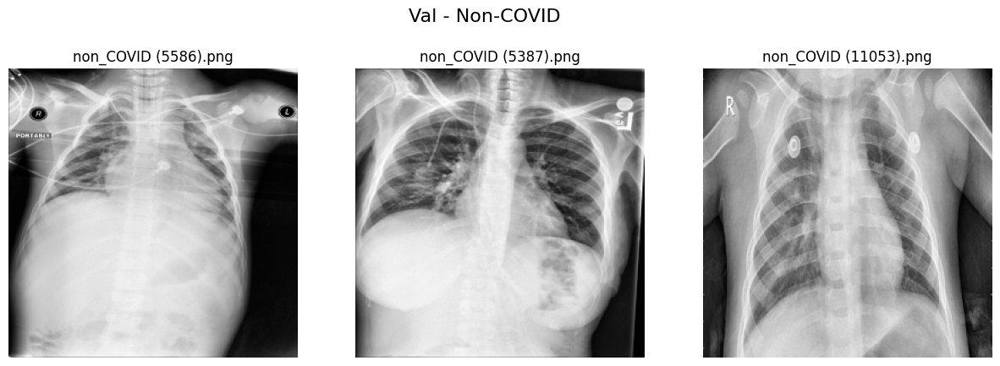

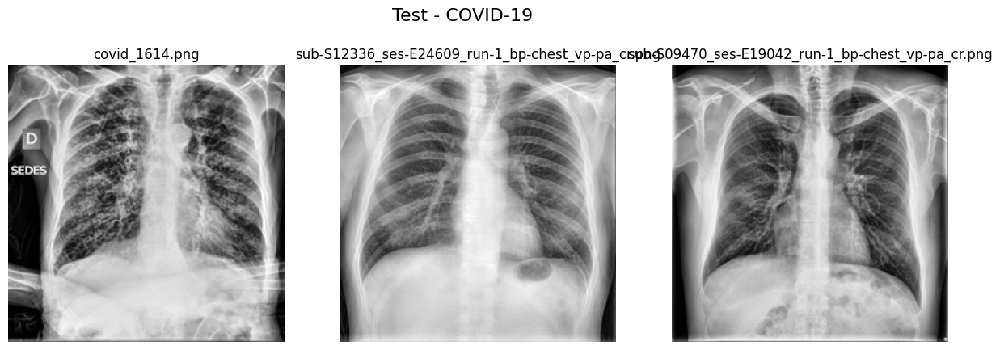

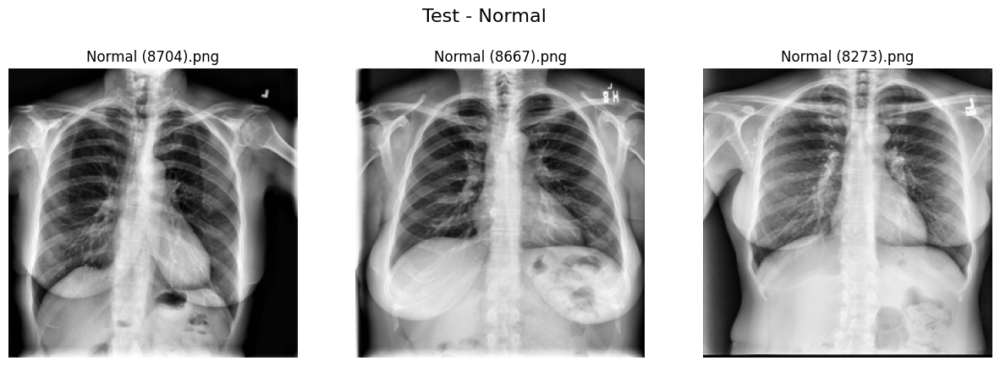

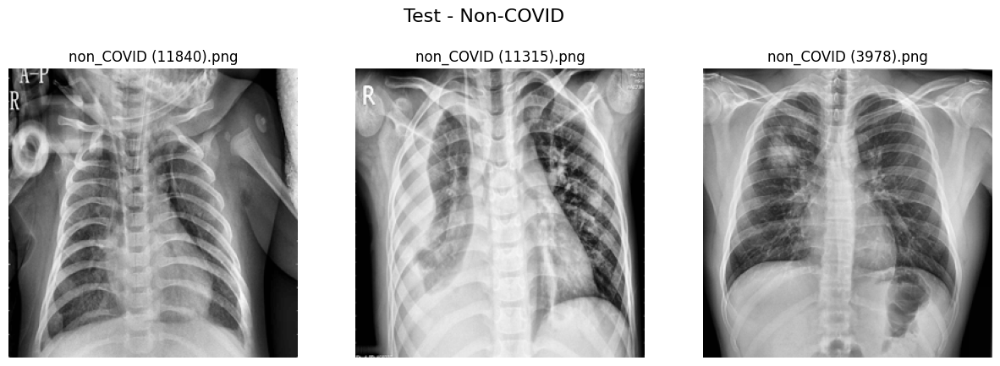

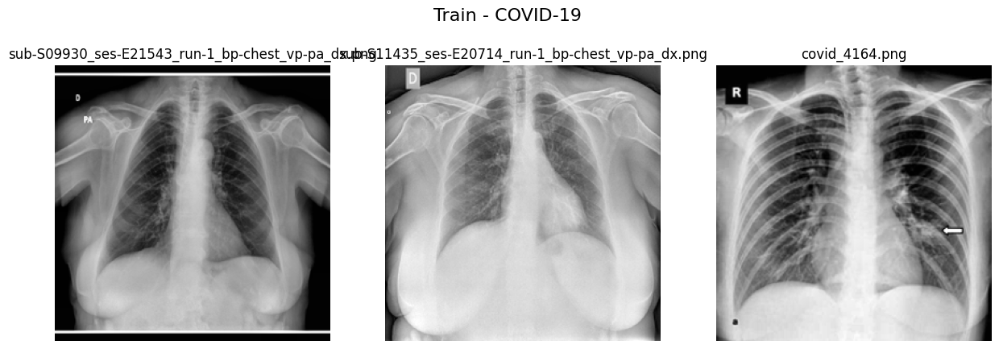

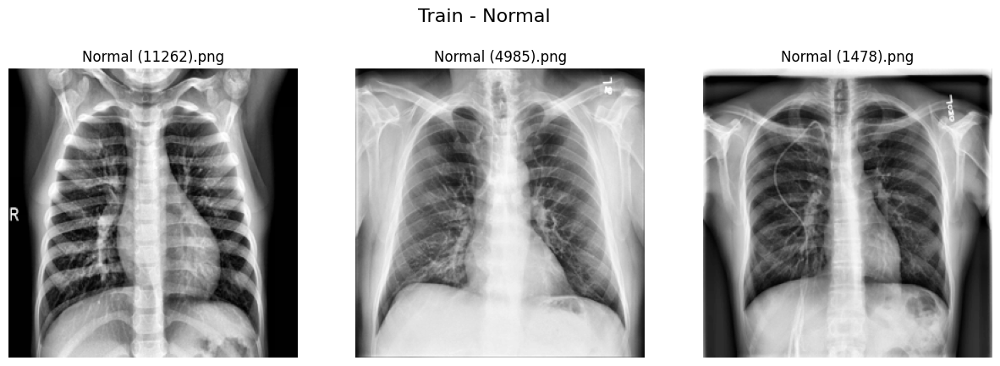

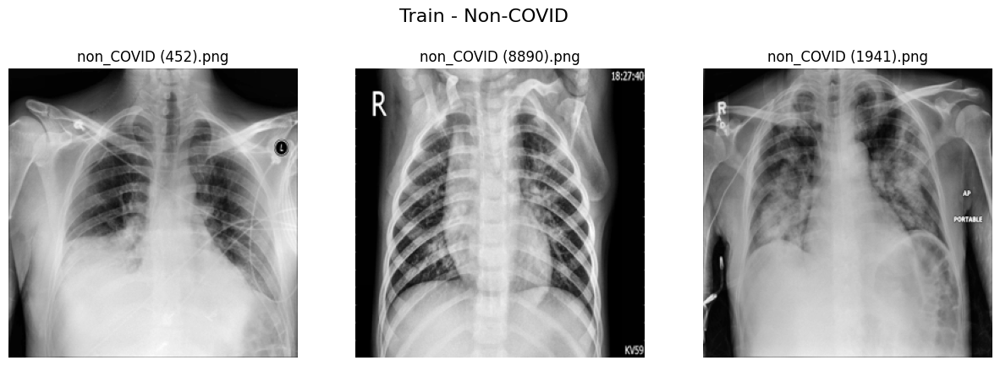

In [25]:
display_random_images_from_sets(base_path=clahe_images_path, sets=sets, groups=groups, num_images=3)

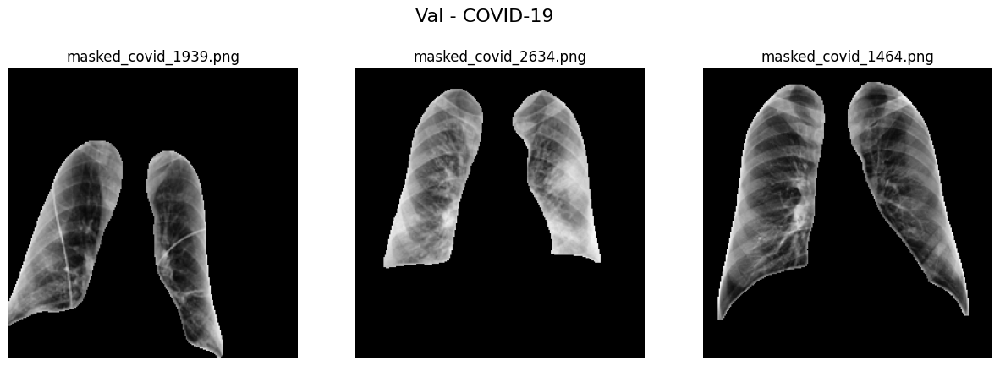

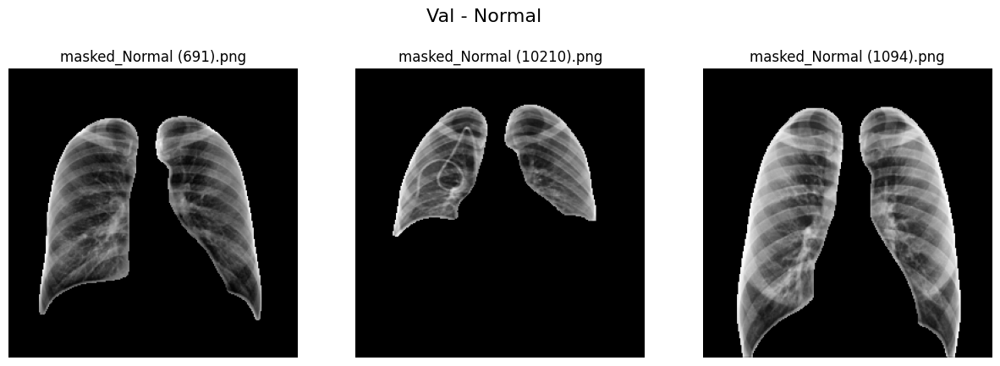

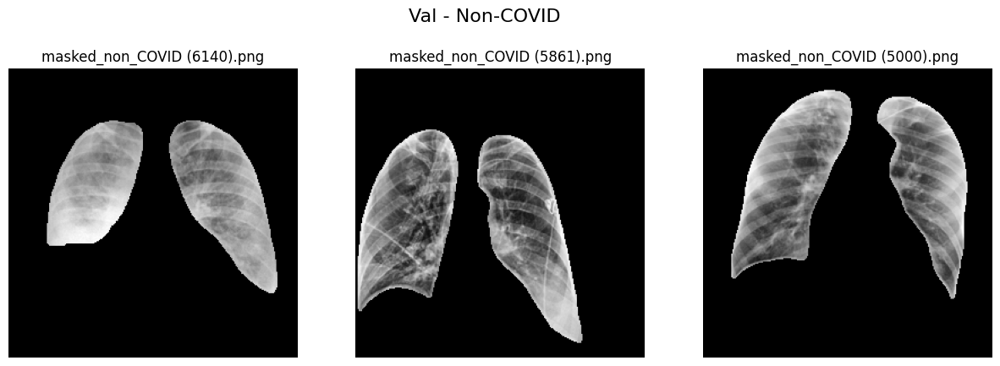

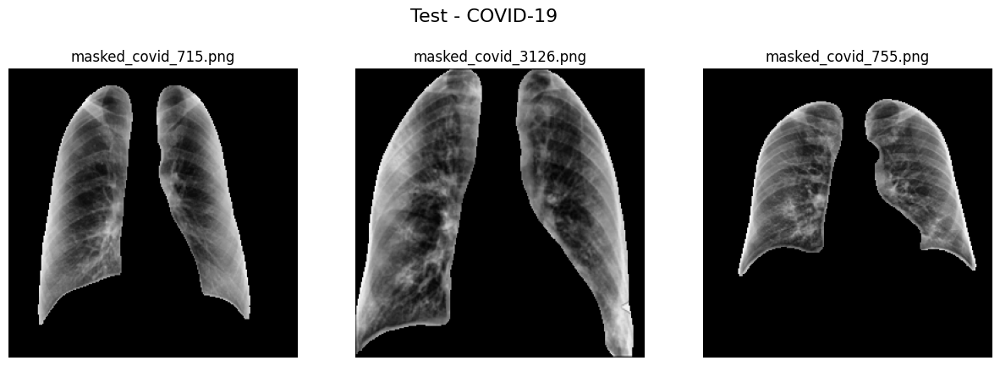

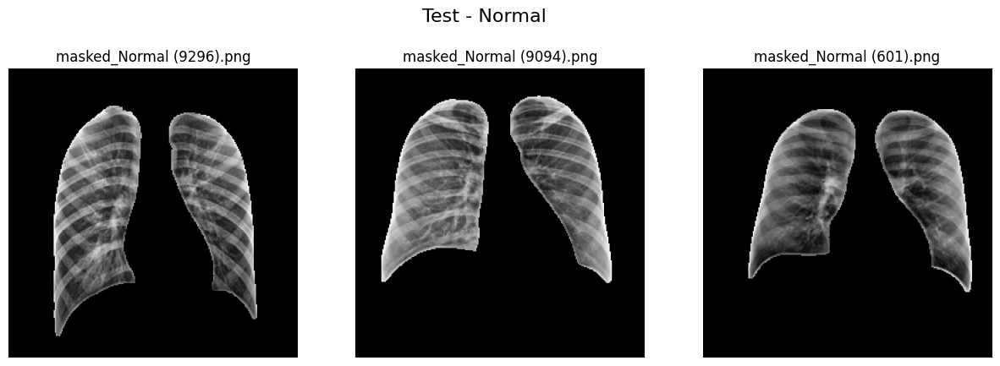

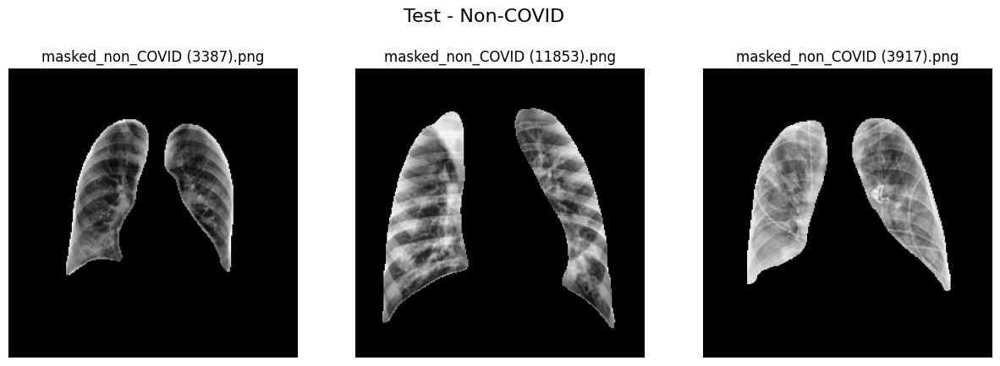

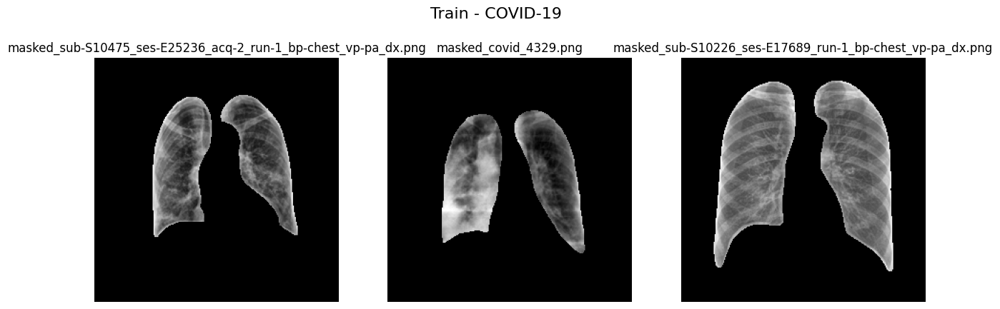

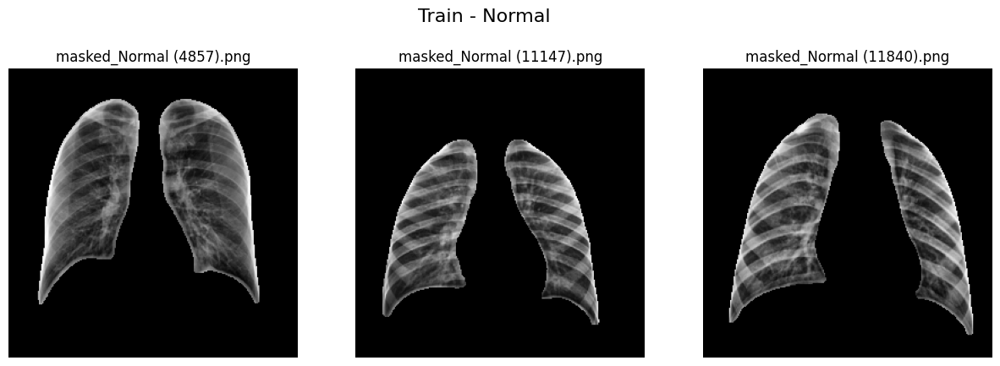

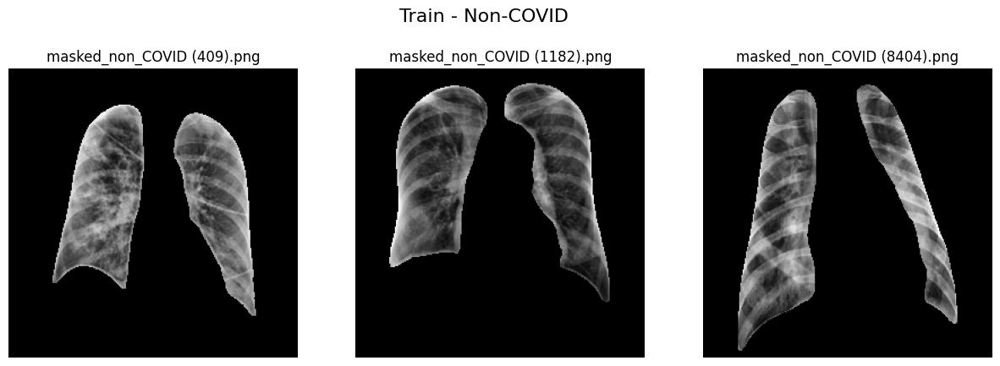

In [26]:
display_random_images_from_sets(base_path=masked_normalized_images_path, sets=sets, groups=groups, num_images=3)

## 2. Preprocessing for the model

Preprocessing the images using a preprocessing function and transformations to test the model on masked clahe images.

### 2.1 Preprocessing function

Unnecessary for pytorch as we use the transform method in this case.

In [35]:
# def preprocess_image(img):
#     """
#     Preprocess the image for VGG19 input.

#     Args:
#         img (numpy.array): Input image array.

#     Returns:
#         torch.Tensor: Preprocessed image tensor.
#     """
#     if img is None:
#         raise ValueError("No image data received!")
         
#     # Rescale pixel values to [0, 1]
#     img = img / 255.0

#     # Convert numpy array to PIL Image
#     img = Image.fromarray((img * 255).astype(np.uint8))

#     # Define the transformations for VGG19
#     transform = transforms.Compose([
#         transforms.Resize((224, 224)),  # Resize the image to 224x224 as required by VGG19
#         transforms.ToTensor(),  # Converts the PIL image to a PyTorch tensor
#         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with VGG19's mean and std
#     ])

#     # Apply the transformations
#     img = transform(img)

#     return img

### 2.2 Dataloaders and Datasets

In [5]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None, preprocess_function=None, class_to_idx=None):
        self.root_dir = root_dir
        self.transform = transform
        self.preprocess_function = preprocess_function
        self.image_paths = []
        self.labels = []
        self.class_to_idx = class_to_idx
        self._load_dataset()

    def _load_dataset(self): 
        for class_name in os.listdir(self.root_dir):
            class_dir = os.path.join(self.root_dir, class_name, 'images')
            if os.path.isdir(class_dir):
                for img_name in os.listdir(class_dir):
                    img_path = os.path.join(class_dir, img_name)
                    self.image_paths.append(img_path)
                    self.labels.append(self.class_to_idx[class_name])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        if idx >= len(self.image_paths):
            raise IndexError(f"Index {idx} out of range for dataset of length {len(self.image_paths)}")

        img_path = self.image_paths[idx]
        try:
            image = Image.open(img_path).convert('RGB')
            label = self.labels[idx]

            if self.preprocess_function:
                image = self.preprocess_function(image)

            if self.transform:
                image = self.transform(image)

            return image, label
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            return None
            

# Data augmentation for training set
train_transform = transforms.Compose([
    transforms.RandomRotation(20),
    transforms.RandomHorizontalFlip(),
    transforms.RandomResizedCrop(224),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),  # This should come before Normalize
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Only preprocessing for validation and test sets
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),  # This should come before Normalize
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create the class_to_idx mapping
class_to_idx = {class_name: idx for idx, class_name in enumerate(os.listdir(os.path.join(masked_normalized_images_path, 'Train')))}

# Initialize datasets with the class_to_idx mapping
train_dataset = CustomDataset(root_dir=os.path.join(masked_normalized_images_path, 'Train'), transform=train_transform, class_to_idx=class_to_idx)
val_dataset = CustomDataset(root_dir=os.path.join(masked_normalized_images_path, 'Val'), transform=test_transform, class_to_idx=class_to_idx)
test_dataset = CustomDataset(root_dir=os.path.join(masked_normalized_images_path, 'Test'), transform=test_transform, class_to_idx=class_to_idx)

# Create DataLoaders

def collate_fn(batch):
    batch = [item for item in batch if item is not None]
    if not batch:  # In case all items are None, return a batch with None
        return None, None
    return torch.utils.data.dataloader.default_collate(batch)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=0, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0, collate_fn=collate_fn)

In [6]:
# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Verification step
for x_batch, y_batch in train_loader:
    if x_batch is None or y_batch is None:
        print("Encountered an empty batch")
        continue

    print(f"Type of x_batch: {type(x_batch)}")  # Debug print
    print(f"Type of y_batch: {type(y_batch)}")  # Debug print
    print(f"x_batch content example: {x_batch}")  # Debug print
    print(f"y_batch content example: {y_batch}")  # Debug print

    x_batch, y_batch = x_batch.to(device), y_batch.to(device)
    print(f"x_batch is on {x_batch.device}")  # Should print cuda if using GPU
    print(f"y_batch is on {y_batch.device}")  # Should print cuda if using GPU
    print(x_batch.size())  # Should show (32, 3, 224, 224) if full batch
    print(y_batch.size())  # Shape will depend on how labels are implemented
    break  # Just check the first batch

Type of x_batch: <class 'torch.Tensor'>
Type of y_batch: <class 'torch.Tensor'>
x_batch content example: tensor([[[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

         [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]]

--- Displaying images from the Train set ---
Class: COVID-19


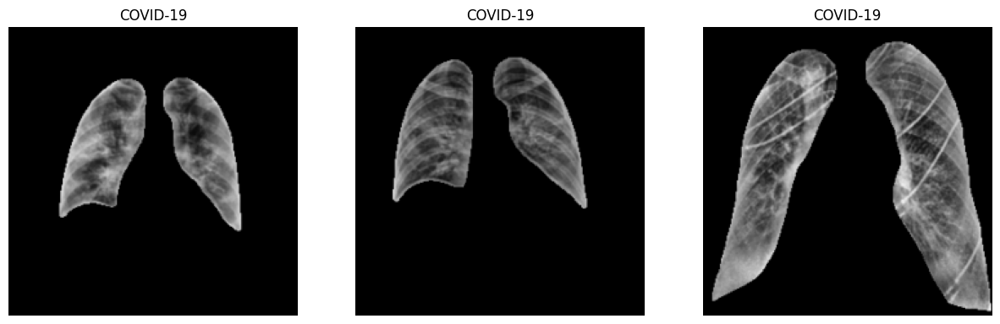

Class: Normal


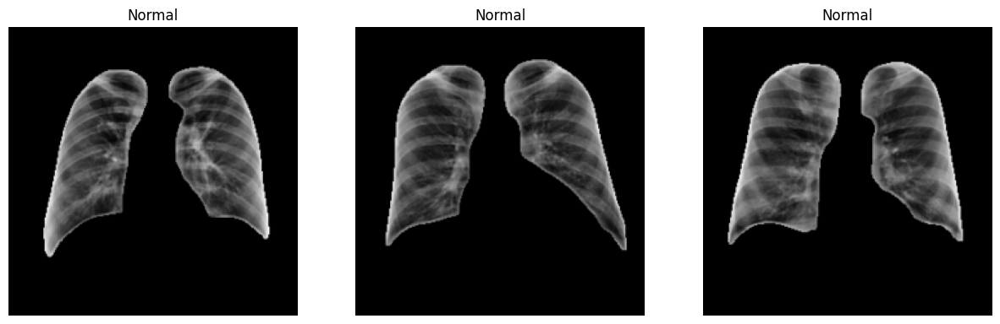

Class: Non-COVID


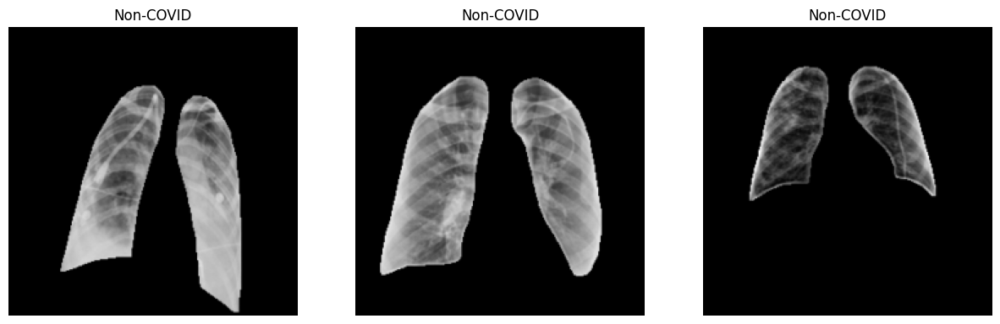

--- Displaying images from the Val set ---
Class: COVID-19


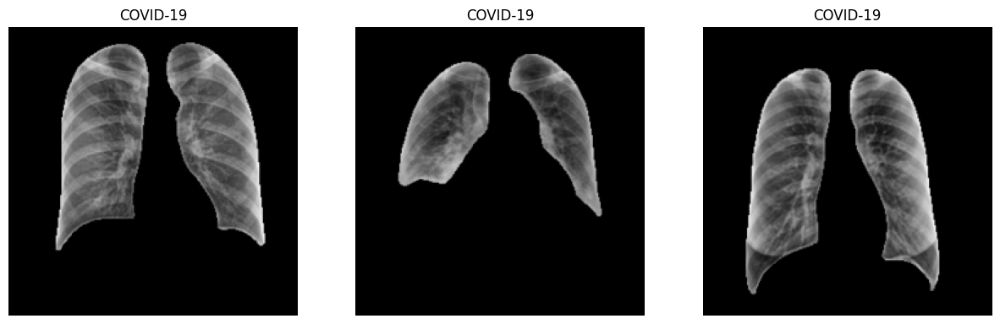

Class: Normal


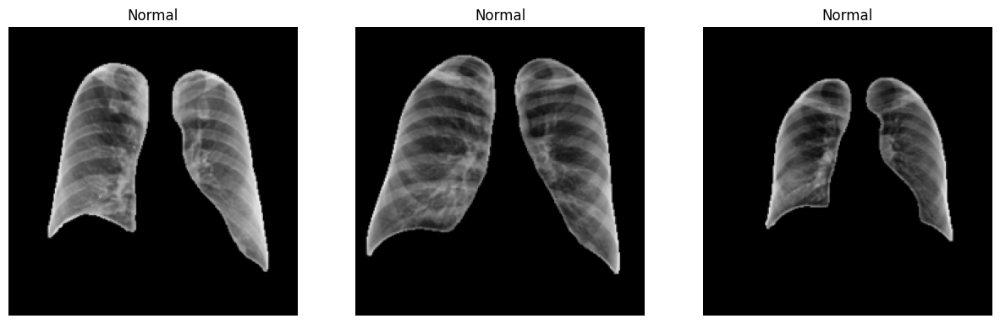

Class: Non-COVID


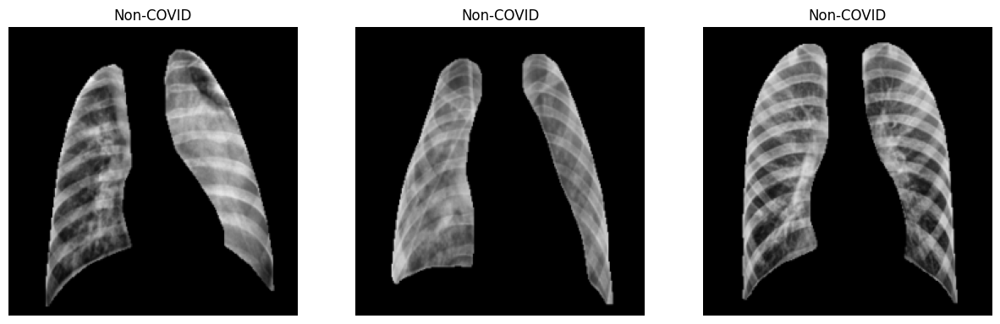

--- Displaying images from the Test set ---
Class: COVID-19


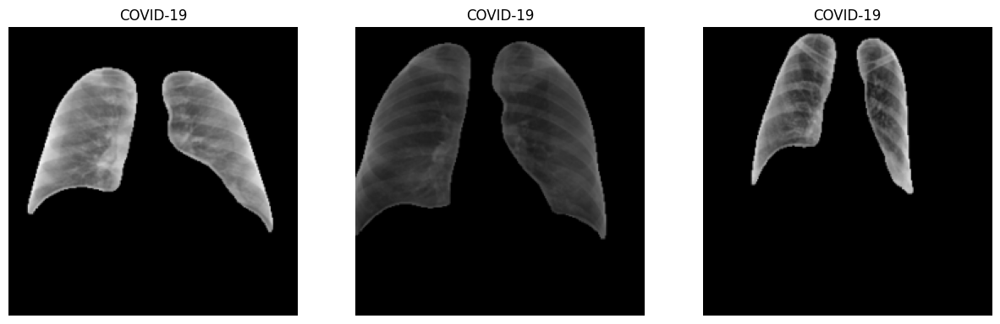

Class: Normal


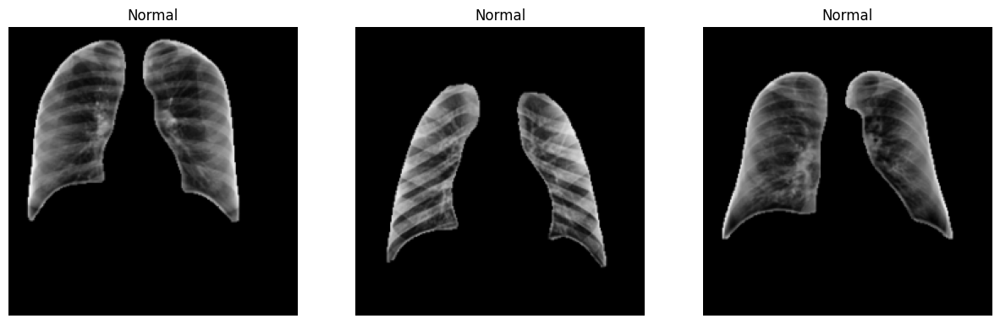

Class: Non-COVID


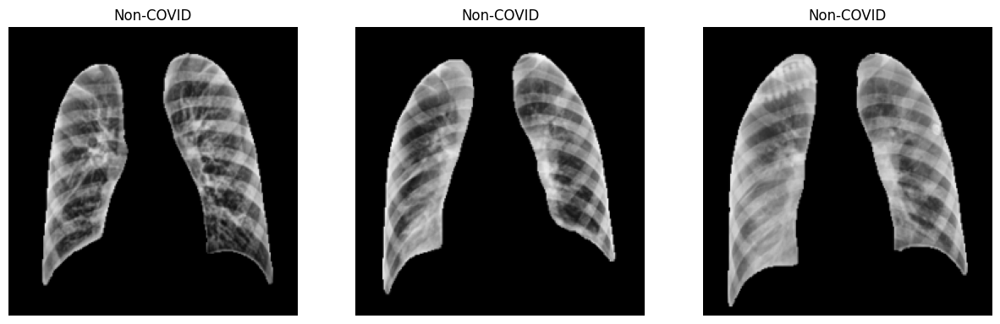

In [8]:
def display_sample_images(data_path, groups, sets, num_samples=3, class_to_idx=None, preprocess_function=None):
    """
    Displays sample images for each class from each dataset.

    Args:
        data_path (str): Path to the dataset.
        groups (list): List of class names, e.g., ['COVID-19', 'Normal', 'Non-COVID'].
        sets (list): List of dataset names, e.g., ['Val', 'Test', 'Train'].
        num_samples (int): Number of images to display per class.
        class_to_idx (dict): Dictionary mapping class names to indices.
        preprocess_function (callable, optional): Function to preprocess the images.
    """
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])

    for set_name in sets:
        print(f"--- Displaying images from the {set_name} set ---")
        
        # Initialize the dataset
        dataset = CustomDataset(root_dir=os.path.join(data_path, set_name), transform=transform, preprocess_function=preprocess_function, class_to_idx=class_to_idx)

        for group in groups:
            print(f"Class: {group}")
            found = 0
            images = []

            # Collect sample images
            for img, label in dataset:
                if dataset.class_to_idx[group] == label:
                    images.append(img)
                    found += 1
                    if found >= num_samples:
                        break

            # Display the images
            fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))
            for i in range(num_samples):
                axes[i].imshow(images[i].permute(1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
                axes[i].axis('off')
                axes[i].set_title(f"{group}")
            plt.show()

# Displaying 3 images per group and class
data_path = masked_normalized_images_path
groups = ['COVID-19', 'Normal', 'Non-COVID']
sets = ['Train', 'Val', 'Test']

# Create the class_to_idx mapping
class_to_idx = {class_name: idx for idx, class_name in enumerate(groups)}

display_sample_images(data_path, groups, sets, num_samples=3, class_to_idx=class_to_idx)

## 3. Model structure

In [ ]:
### 3.1 Model construction

In [30]:
# Define the model class
class CustomVGG19Model(LightningModule):
    def __init__(self, hp):
        super(CustomVGG19Model, self).__init__()
        self.hp = hp

        # Load the VGG19 model pretrained on ImageNet
        self.base_vgg19 = models.vgg19(pretrained=True)
        for param in self.base_vgg19.parameters():
            param.requires_grad = True
        
        # Modify the classifier to fit the table specification
        self.features = self.base_vgg19.features
        
        self.conv2d_1 = nn.Conv2d(512, 128, kernel_size=3, padding=1)  # Note: padding added to maintain output shape
        self.activation_1 = nn.ReLU()
        
        self.conv2d_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)  # Note: padding added to maintain output shape
        self.activation_2 = nn.ReLU()
        
        self.batch_normalization = nn.BatchNorm2d(128)
        self.max_pool2d = nn.MaxPool2d(kernel_size=2)
        self.dropout_1 = nn.Dropout(self.hp['dropout_1'])
        self.flatten = nn.Flatten()
        
        # Determine the input size to the dense layer
        dummy_input = torch.zeros(1, 3, 224, 224)
        with torch.no_grad():
            dummy_output = self.features(dummy_input)
            dummy_output = self.conv2d_1(dummy_output)
            dummy_output = self.activation_1(dummy_output)
            dummy_output = self.conv2d_2(dummy_output)
            dummy_output = self.activation_2(dummy_output)
            dummy_output = self.batch_normalization(dummy_output)
            dummy_output = self.max_pool2d(dummy_output)
            n_features = dummy_output.numel()

        self.dense = nn.Linear(n_features, 512)  # Update with correct number of input features
        self.dropout_2 = nn.Dropout(self.hp['dropout_2'])
        self.output = nn.Linear(512, 3)  # Adjust output size as required
        
    def forward(self, x):
        x = self.features(x)
        x = self.conv2d_1(x)
        x = self.activation_1(x)
        x = self.conv2d_2(x)
        x = self.activation_2(x)
        x = self.batch_normalization(x)
        x = self.max_pool2d(x)
        x = self.dropout_1(x)
        x = self.flatten(x)
        x = self.dense(x)
        x = self.dropout_2(x)
        x = self.output(x)
        return x

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.hp['learning_rate'])
        return optimizer

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = (y_hat.argmax(dim=1) == y).float().mean()
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = (y_hat.argmax(dim=1) == y).float().mean()
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        return loss

### 3.2 Tuning

In [31]:
# Define the objective function for Optuna
def objective(trial):
    hp = {
        'dropout_1': trial.suggest_float('dropout_1', 0.4, 0.7, step=0.1),
        'dropout_2': trial.suggest_float('dropout_2', 0.4, 0.7, step=0.1),
        'learning_rate': trial.suggest_categorical('learning_rate', [0.00006, 0.00009, 0.001])
    }

    # Initialize model
    model =CustomVGG19Model(hp)

    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min')
    checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min')

    trainer = Trainer(
        max_epochs=10,
        callbacks=[
            early_stopping,
            checkpoint_callback
        ],
        logger=True  # Enable logger to log metrics
    )
    
    trainer.fit(model, train_loader, val_loader)
    
    # Return the validation loss for the last epoch
    val_loss = trainer.callback_metrics["val_loss"].item()
    return val_loss

# Create an Optuna study and optimize the objective function
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=5)

# Print the best hyperparameters
print("Best hyperparameters: ", study.best_trial.params)

[I 2024-05-17 01:38:28,680] A new study created in memory with name: no-name-218fdb3b-7f50-4a31-ba76-c4facb15c86b
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                | Type        | Params
-----------------------------------------------------
0  | base_vgg19          | VGG         | 143 M 
1  | features            | Sequential  | 20.0 M
2  | conv2d_1            | Conv2d      | 589 K 
3  | activation_1        | ReLU        | 0     
4  | conv2d_2            | Conv2d      | 147 K 
5  | activation_2        | ReLU        | 0     
6  | batch_normalization | BatchNorm2d | 256   
7  | max_pool2d          | MaxPool2d   | 0     
8  | dropout_1           | Dropout     | 0     
9  | flatten             | Flatten     | 0     
10 | dense               | Linear      | 590 K 
11 | dropout_2           | Dropout     | 0     
12 | output  

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


c:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Epoch 0: 100%|██████████| 679/679 [05:17<00:00,  2.14it/s, v_num=10]

c:\Users\Nicolas\Documents\DataScience\Projet_Radio_Covid\dataset_covid_projet\.venv\Lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Epoch 9: 100%|██████████| 679/679 [05:27<00:00,  2.07it/s, v_num=10, val_loss=0.367, val_acc=0.864, train_loss=0.483, train_acc=0.805]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 679/679 [05:27<00:00,  2.07it/s, v_num=10, val_loss=0.367, val_acc=0.864, train_loss=0.483, train_acc=0.805]


[I 2024-05-17 02:34:14,364] Trial 0 finished with value: 0.3669045865535736 and parameters: {'dropout_1': 0.6000000000000001, 'dropout_2': 0.5, 'learning_rate': 9e-05}. Best is trial 0 with value: 0.3669045865535736.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                | Type        | Params
-----------------------------------------------------
0  | base_vgg19          | VGG         | 143 M 
1  | features            | Sequential  | 20.0 M
2  | conv2d_1            | Conv2d      | 589 K 
3  | activation_1        | ReLU        | 0     
4  | conv2d_2            | Conv2d      | 147 K 
5  | activation_2        | ReLU        | 0     
6  | batch_normalization | BatchNorm2d | 256   
7  | max_pool2d          | MaxPool2d   | 0     
8  | dropout_1           | Dropout     | 0     
9  | flatten             | Flatten     | 0     
10 | d

Epoch 5: 100%|██████████| 679/679 [05:27<00:00,  2.07it/s, v_num=11, val_loss=0.531, val_acc=0.817, train_loss=0.542, train_acc=0.779]


[I 2024-05-17 03:07:14,551] Trial 1 finished with value: 0.5306790471076965 and parameters: {'dropout_1': 0.6000000000000001, 'dropout_2': 0.6000000000000001, 'learning_rate': 9e-05}. Best is trial 0 with value: 0.3669045865535736.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                | Type        | Params
-----------------------------------------------------
0  | base_vgg19          | VGG         | 143 M 
1  | features            | Sequential  | 20.0 M
2  | conv2d_1            | Conv2d      | 589 K 
3  | activation_1        | ReLU        | 0     
4  | conv2d_2            | Conv2d      | 147 K 
5  | activation_2        | ReLU        | 0     
6  | batch_normalization | BatchNorm2d | 256   
7  | max_pool2d          | MaxPool2d   | 0     
8  | dropout_1           | Dropout     | 0     
9  | flatten             | Flatten     

Epoch 7: 100%|██████████| 679/679 [05:26<00:00,  2.08it/s, v_num=12, val_loss=0.490, val_acc=0.804, train_loss=0.503, train_acc=0.794]


[I 2024-05-17 03:51:05,646] Trial 2 finished with value: 0.48996275663375854 and parameters: {'dropout_1': 0.4, 'dropout_2': 0.4, 'learning_rate': 9e-05}. Best is trial 0 with value: 0.3669045865535736.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                | Type        | Params
-----------------------------------------------------
0  | base_vgg19          | VGG         | 143 M 
1  | features            | Sequential  | 20.0 M
2  | conv2d_1            | Conv2d      | 589 K 
3  | activation_1        | ReLU        | 0     
4  | conv2d_2            | Conv2d      | 147 K 
5  | activation_2        | ReLU        | 0     
6  | batch_normalization | BatchNorm2d | 256   
7  | max_pool2d          | MaxPool2d   | 0     
8  | dropout_1           | Dropout     | 0     
9  | flatten             | Flatten     | 0     
10 | dense          

Epoch 9: 100%|██████████| 679/679 [05:26<00:00,  2.08it/s, v_num=13, val_loss=0.390, val_acc=0.854, train_loss=0.480, train_acc=0.806]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 679/679 [05:26<00:00,  2.08it/s, v_num=13, val_loss=0.390, val_acc=0.854, train_loss=0.480, train_acc=0.806]


[I 2024-05-17 04:45:54,358] Trial 3 finished with value: 0.3896949589252472 and parameters: {'dropout_1': 0.5, 'dropout_2': 0.4, 'learning_rate': 9e-05}. Best is trial 0 with value: 0.3669045865535736.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                | Type        | Params
-----------------------------------------------------
0  | base_vgg19          | VGG         | 143 M 
1  | features            | Sequential  | 20.0 M
2  | conv2d_1            | Conv2d      | 589 K 
3  | activation_1        | ReLU        | 0     
4  | conv2d_2            | Conv2d      | 147 K 
5  | activation_2        | ReLU        | 0     
6  | batch_normalization | BatchNorm2d | 256   
7  | max_pool2d          | MaxPool2d   | 0     
8  | dropout_1           | Dropout     | 0     
9  | flatten             | Flatten     | 0     
10 | dense           

Epoch 9: 100%|██████████| 679/679 [05:27<00:00,  2.07it/s, v_num=14, val_loss=0.366, val_acc=0.850, train_loss=0.472, train_acc=0.810]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 679/679 [05:32<00:00,  2.04it/s, v_num=14, val_loss=0.366, val_acc=0.850, train_loss=0.472, train_acc=0.810]


[I 2024-05-17 05:40:59,666] Trial 4 finished with value: 0.3658304214477539 and parameters: {'dropout_1': 0.5, 'dropout_2': 0.7, 'learning_rate': 6e-05}. Best is trial 4 with value: 0.3658304214477539.


Best hyperparameters:  {'dropout_1': 0.5, 'dropout_2': 0.7, 'learning_rate': 6e-05}


In [32]:
# Print the best hyperparameters
print("Best hyperparameters: ", study.best_trial.params)

Best hyperparameters:  {'dropout_1': 0.5, 'dropout_2': 0.7, 'learning_rate': 6e-05}


### 3.3 Training

In [34]:
# Initialize model with best hyperparameters
best_hp = study.best_trial.params
model = CustomVGG19Model(best_hp)

# Unfreeze the last two blocks of the base VGG19 model
for param in model.base_vgg19.features[-10:].parameters():  # Adjust the range according to the layers to unfreeze
    param.requires_grad = True

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, mode='min')
checkpoint_callback = ModelCheckpoint(monitor='val_loss', mode='min')

# Define a new optimizer with a different learning rate for the unfrozen layers
optimizer = optim.Adam([
    {'params': model.base_vgg19.features[-8:].parameters(), 'lr': best_hp['learning_rate'] / 10},
    {'params': model.conv2d_1.parameters()},
    {'params': model.activation_1.parameters()},
    {'params': model.batch_normalization.parameters()},
    {'params': model.max_pool2d.parameters()},
    {'params': model.dropout_1.parameters()},
    {'params': model.flatten.parameters()},
    {'params': model.dense.parameters()},
    {'params': model.dropout_2.parameters()},
    {'params': model.output.parameters()},
], lr=best_hp['learning_rate'])

# Define the Trainer with fine-tuning parameters
trainer_ft = Trainer(
    max_epochs=25,  # Increase the number of epochs for fine-tuning
    callbacks=[
        early_stopping,
        checkpoint_callback
    ],
    logger=True  # Enable logger to log metrics
)

# Fine-tune the model
trainer_ft.fit(model, train_loader, val_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                | Type        | Params
-----------------------------------------------------
0  | base_vgg19          | VGG         | 143 M 
1  | features            | Sequential  | 20.0 M
2  | conv2d_1            | Conv2d      | 589 K 
3  | activation_1        | ReLU        | 0     
4  | conv2d_2            | Conv2d      | 147 K 
5  | activation_2        | ReLU        | 0     
6  | batch_normalization | BatchNorm2d | 256   
7  | max_pool2d          | MaxPool2d   | 0     
8  | dropout_1           | Dropout     | 0     
9  | flatten             | Flatten     | 0     
10 | dense               | Linear      | 590 K 
11 | dropout_2           | Dropout     | 0     
12 | output              | Linear      | 1.5 K 
-----------------------------------------------------
144 M     Trainable param

Epoch 24: 100%|██████████| 679/679 [05:55<00:00,  1.91it/s, v_num=15, val_loss=0.343, val_acc=0.866, train_loss=0.379, train_acc=0.848]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 24: 100%|██████████| 679/679 [05:55<00:00,  1.91it/s, v_num=15, val_loss=0.343, val_acc=0.866, train_loss=0.379, train_acc=0.848]


In [35]:
# Save the entire model
torch.save(model, 'model_VGG19CNN.pth')

# Save the model weights
torch.save(model.state_dict(), 'model_VGG19CNN_weights.pth')

### 3.3 Training visualization

In [ ]:
# Utility function to plot training history
def plot_metrics(metrics):
    plt.figure(figsize=(12, 4))
    
    # Plot loss
    plt.subplot(121)
    plt.plot(metrics['train_loss'], label='Train Loss')
    plt.plot(metrics['val_loss'], label='Val Loss')
    plt.title('Model Loss by Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot accuracy
    plt.subplot(122)
    plt.plot(metrics['train_acc'], label='Train Accuracy')
    plt.plot(metrics['val_acc'], label='Val Accuracy')
    plt.title('Model Accuracy by Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

# Extract metrics from the logger
metrics = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

for epoch in range(25):  # Assuming 10 epochs
    metrics['train_loss'].append(trainer_ft.logged_metrics.get(f'train_loss_epoch', 0))
    metrics['val_loss'].append(trainer_ft.logged_metrics.get(f'val_loss_epoch', 0))
    metrics['train_acc'].append(trainer_ft.logged_metrics.get(f'train_acc_epoch', 0))
    metrics['val_acc'].append(trainer_ft.logged_metrics.get(f'val_acc_epoch', 0))

# Plot the metrics
plot_metrics(metrics)

### 3.4 Model Evaluation

In [38]:
# Evaluation function
def evaluate_model(model, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    total = 0
    criterion = nn.CrossEntropyLoss()

    with torch.no_grad():
        for data, target in test_loader:
            outputs = model(data)
            loss = criterion(outputs, target)
            test_loss += loss.item() * data.size(0)
            _, predicted = torch.max(outputs, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()

    test_loss /= total
    accuracy = correct / total

    return test_loss, accuracy

# Evaluate the model
test_loss, test_accuracy = evaluate_model(model, test_loader)

# Print the evaluation metrics
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Test Loss: 0.2923573223038691
Test Accuracy: 0.8901001767825575


              precision    recall  f1-score   support

       COVID       0.98      0.80      0.88      2395
   Non COVID       0.92      0.91      0.92      2253
      Normal       0.80      0.97      0.88      2140

    accuracy                           0.89      6788
   macro avg       0.90      0.89      0.89      6788
weighted avg       0.90      0.89      0.89      6788



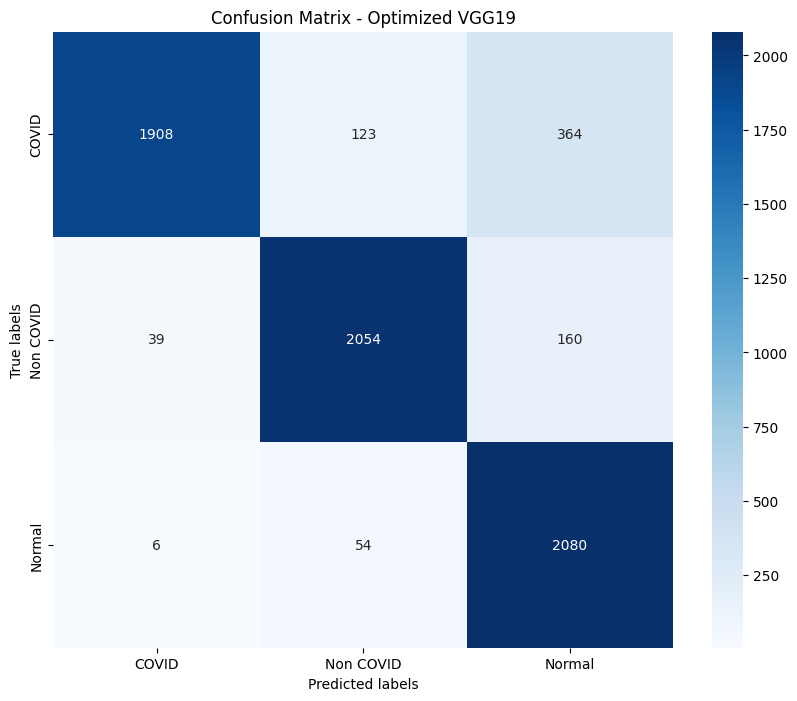

In [60]:
# Define the class names
class_names = ['COVID', 'Non COVID', 'Normal']

# Function to get predictions and true labels
def get_predictions_and_labels(model, loader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for data, labels in loader:
            data, labels = data.to(device), labels.to(device)
            outputs = model(data)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

# Assuming `model` is the trained instance of VGG19Model

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Get predictions and true labels
predicted_classes, true_classes = get_predictions_and_labels(model, test_loader, device)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_names))

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - Optimized VGG19')
plt.show()

In [ ]:
# Define the class names
class_names = {
    0: 'COVID',
    1: 'Non COVID',
    2: 'Normal'
}

# Function to apply the model on a batch of images and visualize the results
def apply_model_and_visualize_multiple_images(model, test_loader, num_images=12):
    model.eval()
    plt.figure(figsize=(15, 15))
    
    # Loop to get and visualize the specified number of images
    for i in range(num_images):
        # Get a random image and its label from the test loader
        data_iter = iter(test_loader)
        images, labels = next(data_iter)
        
        # Apply the trained model to obtain prediction
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        # Convert integer labels to class names
        true_class_name = class_names[labels.item()]
        predicted_class_name = class_names[predicted.item()]
        
        # Visualize the result
        plt.subplot(4, 3, i + 1)
        image = images[0].permute(1, 2, 0).cpu().numpy()
        image = np.clip(image * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406], 0, 1)  # Denormalize
        
        plt.imshow(image)
        
        # Determine title color based on whether true and predicted labels match
        title_color = 'green' if true_class_name == predicted_class_name else 'red'
        
        plt.title(f"True Label: {true_class_name}\nPredicted Label: {predicted_class_name}", color=title_color)
        plt.axis('off')
    
    plt.show()

# Assuming `model` is the trained instance of VGG19Model

# Visualize the results
apply_model_and_visualize_multiple_images(model, test_loader, num_images=12)

## 4. Interpretability

### 4.1 GRADCAM

In [46]:
# Define the class names
class_names = {
    0: 'COVID',
    1: 'Non COVID',
    2: 'Normal'
}

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None

        self.model.eval()
        self.hook_layers()

    def hook_layers(self):
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        def forward_hook(module, input, output):
            self.activation = output

        target_layer = dict([*self.model.named_modules()])[self.target_layer]
        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)

    def generate_cam(self, input_image, target_class):
        # Forward pass
        model_output = self.model(input_image)

        # Zero grads
        self.model.zero_grad()

        # Backward pass
        one_hot_output = torch.zeros_like(model_output)
        one_hot_output[0][target_class] = 1
        model_output.backward(gradient=one_hot_output)

        # Get the gradients and activation
        gradients = self.gradients[0]
        activation = self.activation[0]

        # Global average pooling on gradients
        weights = torch.mean(gradients, dim=[1, 2])

        # Weighted combination of activations and weights
        cam = torch.zeros(activation.shape[1:], dtype=torch.float32).to(input_image.device)
        for i, w in enumerate(weights):
            cam += w * activation[i, :, :]

        # Apply ReLU and normalize
        cam = F.relu(cam)
        cam = cam - cam.min()
        cam = cam / cam.max()
        cam = cam.detach().cpu().numpy()

        return cam

# Function to apply the model on a batch of images and visualize the results
def apply_model_and_visualize_multiple_images(model, test_loader, class_names, num_images=10):
    grad_cam = GradCAM(model, 'base_vgg19.features.29')
    data_iter = iter(test_loader)
    
    for i in range(num_images):
        images, labels = next(data_iter)
        
        image = images[0].unsqueeze(0).to(device)  # Take the first image from the batch and add batch dimension
        label = labels[0].item()
        
        # Apply the trained model to obtain prediction
        outputs = model(image)
        _, predicted_class = torch.max(outputs, 1)
        predicted_class = predicted_class.item()
        
        # Generate Grad-CAM heatmap
        heatmap = grad_cam.generate_cam(image, predicted_class)
        
        # Convert the image to numpy and denormalize
        image = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        image = np.clip(image * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406], 0, 1)
        
        # Resize CAM to image size
        heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
        
        # Convert CAM to heatmap
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255
        
        # Ensure the image is float32 before blending
        image = np.float32(image)
        
        # Combine the heatmap with the original image
        superimposed_img = cv2.addWeighted(image, 0.5, heatmap, 0.5, 0.0)
        
        # Get the class label for the predicted class
        class_label = class_names[predicted_class]
        true_class_name = class_names[label]
        
        title_color = 'green' if true_class_name == class_label else 'red'
        
        # Plot the original image and the Grad-CAM heatmap
        plt.figure(figsize=(15, 5))
        plt.suptitle(f'Image {i+1} - Predicted label: {class_label} | True label: {true_class_name}', fontsize=16, x=0.5, y=0.98, horizontalalignment='right', color=title_color)
        
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying with Matplotlib
        plt.title('Original')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(cv2.cvtColor((superimposed_img * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
        plt.title('Grad-CAM Heatmap')
        plt.axis('off')

        plt.show()

# Assuming `model` is the trained instance of your model and `test_loader` is defined
# Assuming `class_names` is a list of class names

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

CustomVGG19Model(
  (base_vgg19): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True

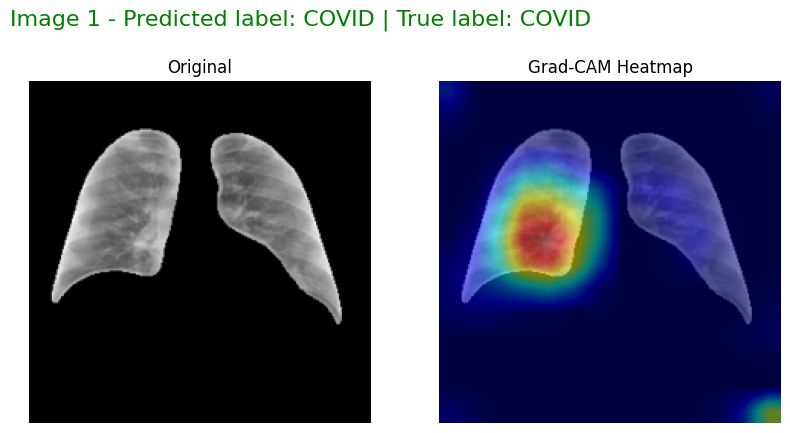

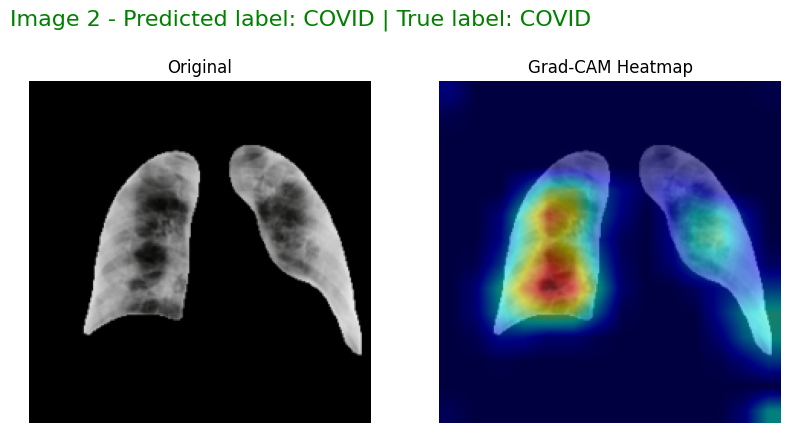

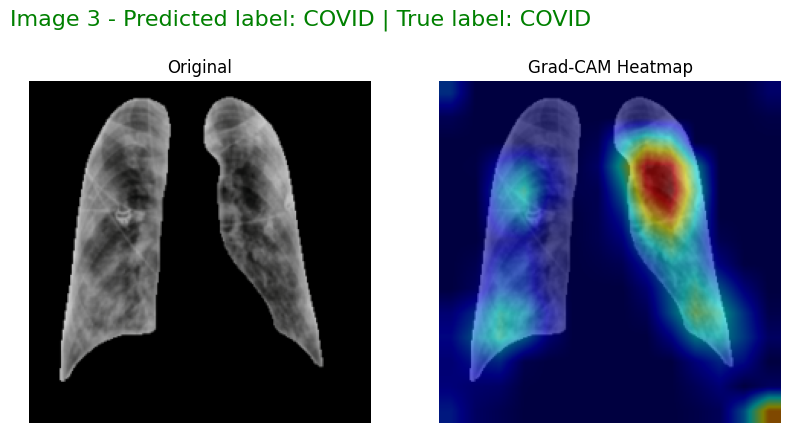

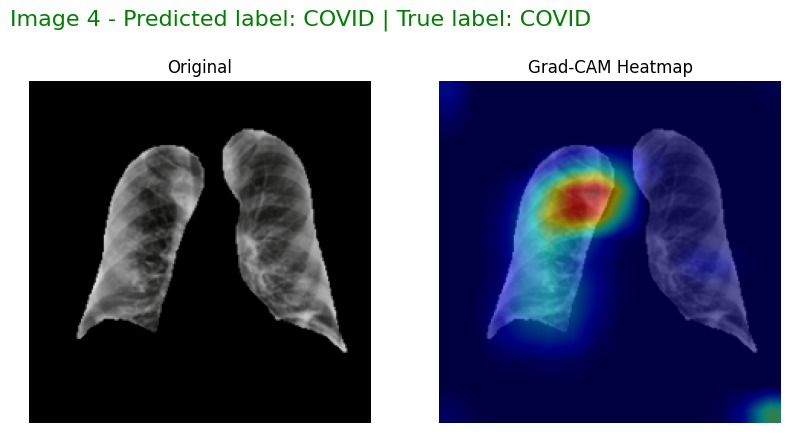

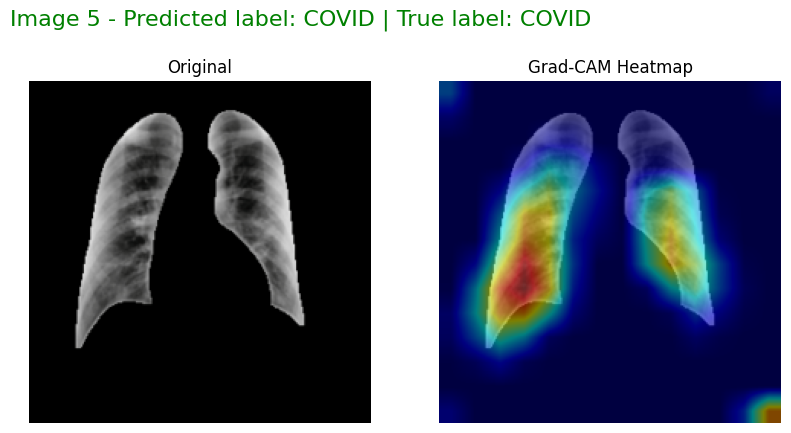

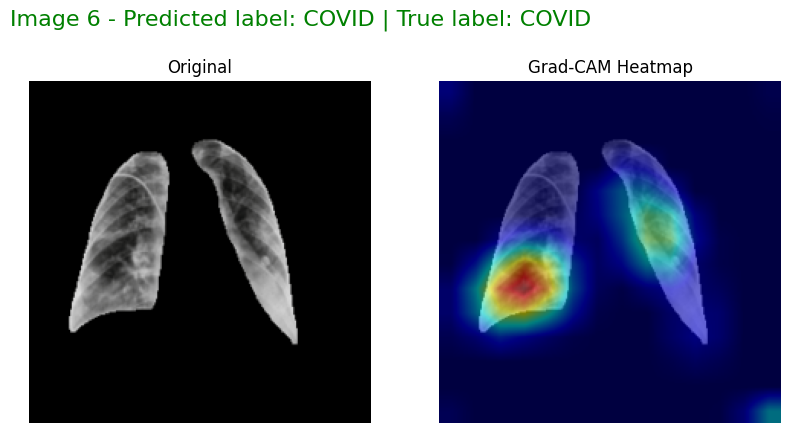

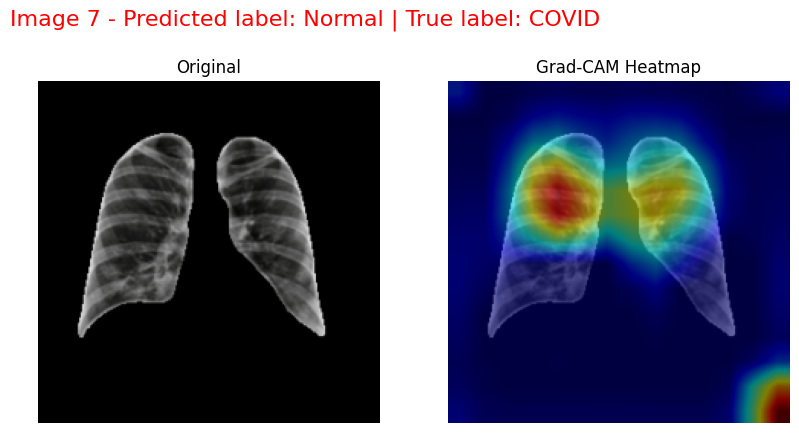

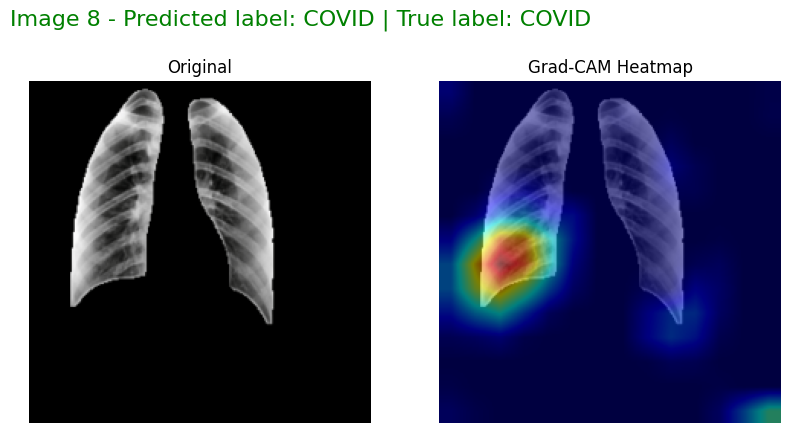

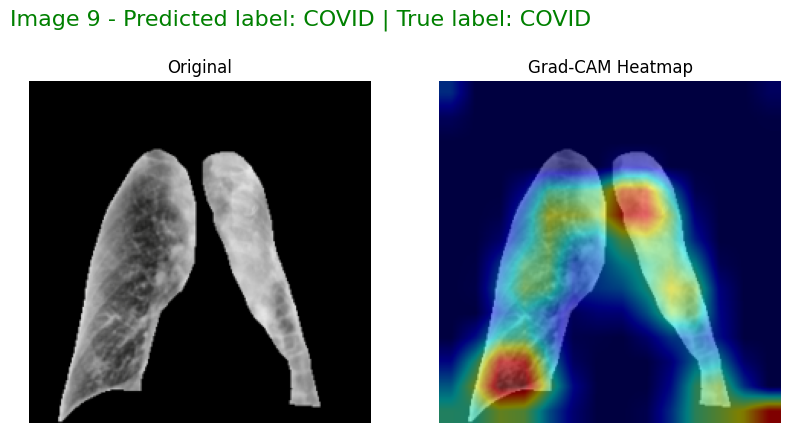

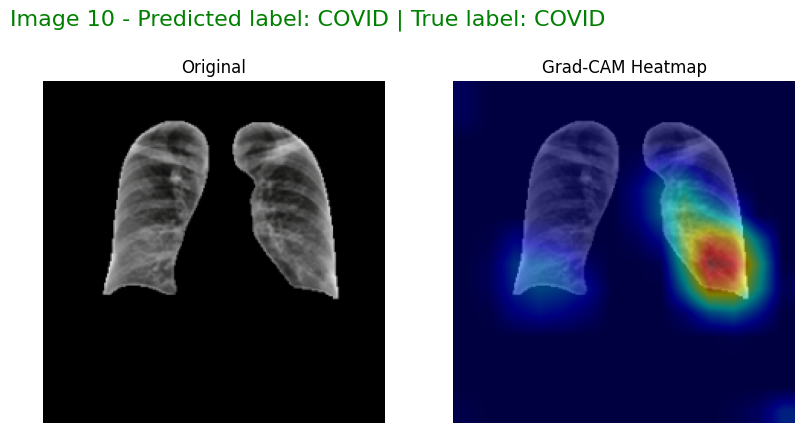

In [47]:
# Visualize the results
apply_model_and_visualize_multiple_images(model, test_loader, class_names, num_images=10)

### 4.2 SCORECAM

In [52]:
class ScoreCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None

        self.model.eval()
        self.hook_layers()

    def hook_layers(self):
        def forward_hook(module, input, output):
            self.activations = output

        target_layer = dict([*self.model.named_modules()])[self.target_layer]
        target_layer.register_forward_hook(forward_hook)

    def generate_cam(self, input_image, target_class):
        device = input_image.device
        _ = self.model(input_image)

        activations = self.activations[0]

        scores = []

        for i in range(activations.size(0)):
            mask = activations[i].unsqueeze(0).unsqueeze(0)
            mask = F.interpolate(mask, size=input_image.shape[2:], mode='bilinear', align_corners=False)
            masked_image = input_image * mask

            with torch.no_grad():
                score = self.model(masked_image)[0][target_class].item()
            scores.append(score)

        scores = torch.tensor(scores).to(device)

        cam = torch.zeros(activations.shape[1:], dtype=torch.float32).to(device)
        for i, score in enumerate(scores):
            cam += score * activations[i, :, :]

        cam = F.relu(cam)
        cam = cam - cam.min()
        cam = cam / cam.max()
        cam = cam.detach().cpu().numpy()

        return cam

In [53]:
def apply_model_and_visualize_multiple_images(model, test_loader, class_names, num_images=10):
    score_cam = ScoreCAM(model, 'base_vgg19.features.29')
    
    data_iter = iter(test_loader)

    for i in range(num_images):
        images, labels = next(data_iter)
        
        image = images[0].unsqueeze(0).to(device)
        label = labels[0].item()
        
        outputs = model(image)
        _, predicted_class = torch.max(outputs, 1)
        predicted_class = predicted_class.item()
        
        heatmap = score_cam.generate_cam(image, predicted_class)
        
        image = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
        image = np.clip(image * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406], 0, 1)
        
        heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255
        
        image = np.float32(image)
        superimposed_img = cv2.addWeighted(image, 0.5, heatmap, 0.5, 0.0)
        
        class_label = class_names[predicted_class]
        true_class_name = class_names[label]
        
        title_color = 'green' if true_class_name == class_label else 'red'
        
        plt.figure(figsize=(15, 5))
        plt.suptitle(f'Image {i+1} - Predicted label: {class_label} | True label: {true_class_name}', fontsize=16, x=0.5, y=0.98, horizontalalignment='right', color=title_color)
        
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
        plt.title('Original')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(cv2.cvtColor((superimposed_img * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
        plt.title('Score-CAM Heatmap')
        plt.axis('off')

        plt.show()

# Assuming `model` is the trained instance of your model and `test_loader` is defined
# Assuming `class_names` is a list of class names

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


CustomVGG19Model(
  (base_vgg19): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True

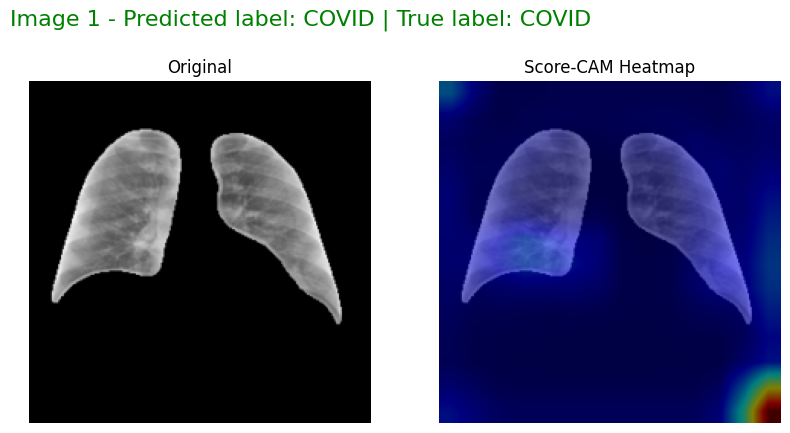

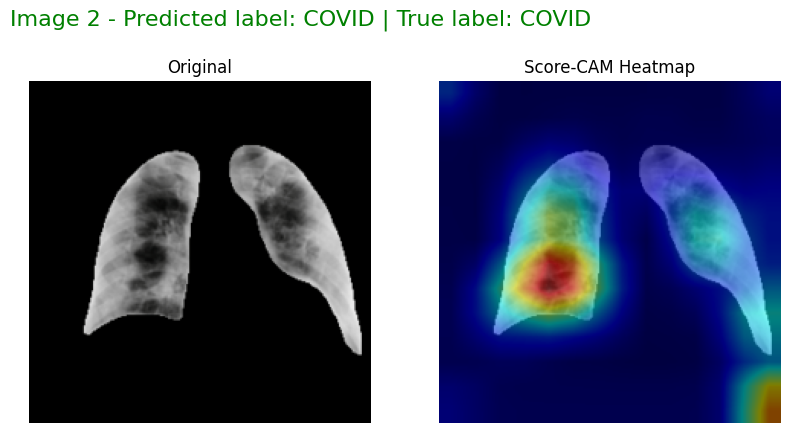

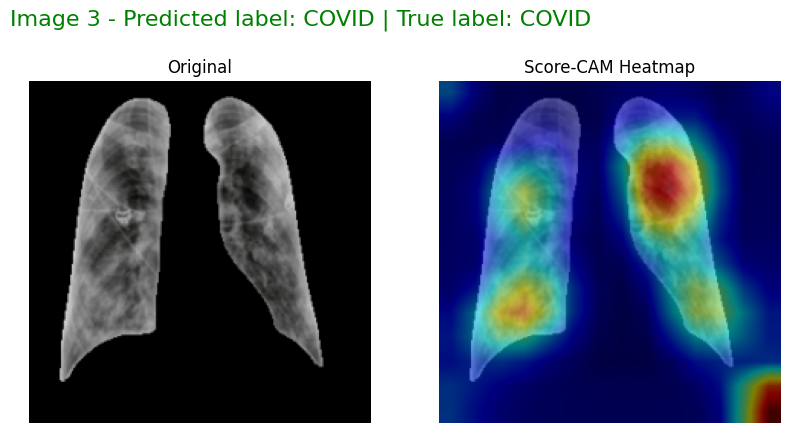

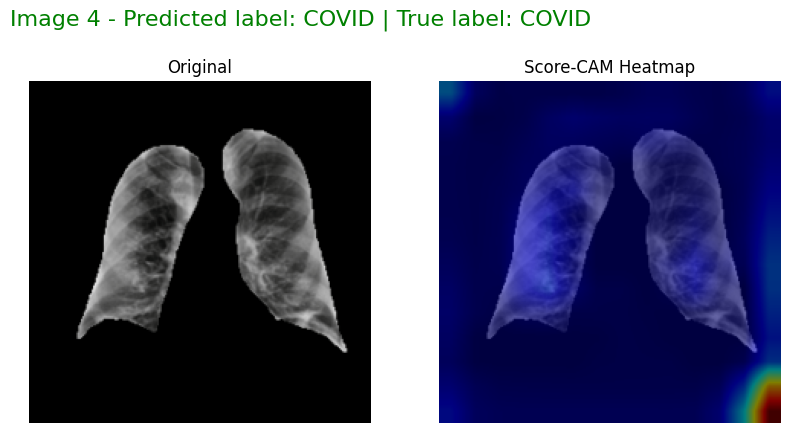

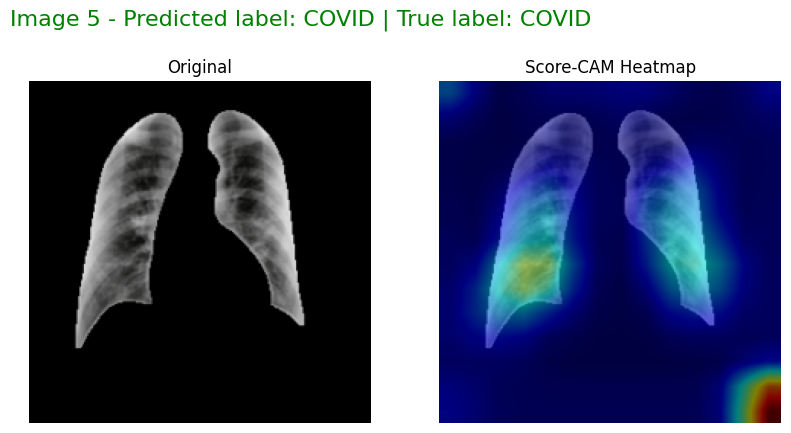

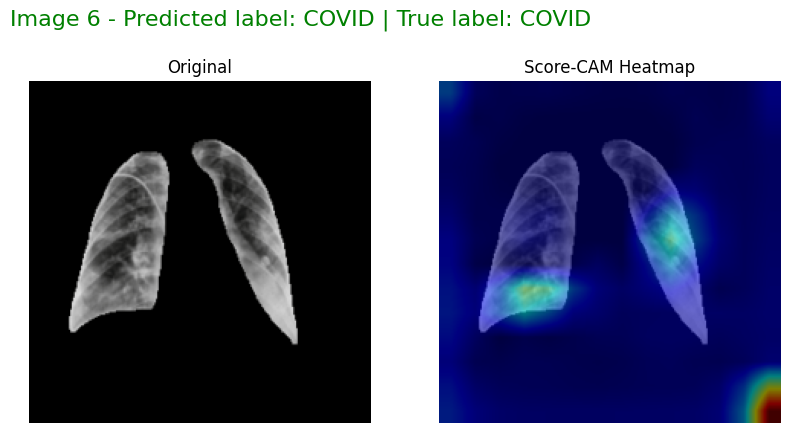

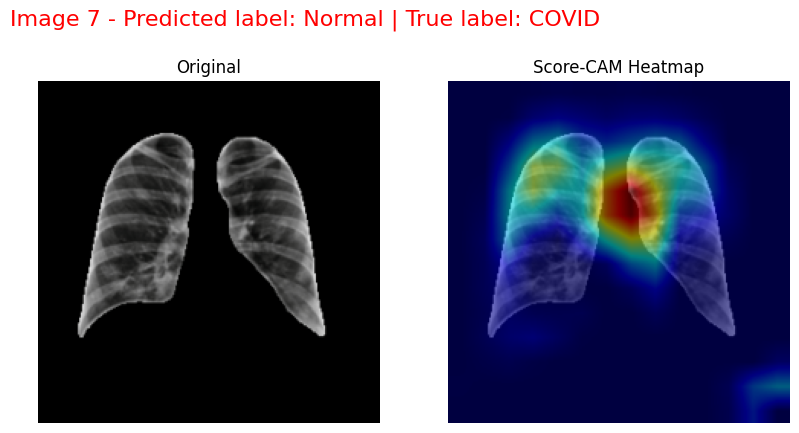

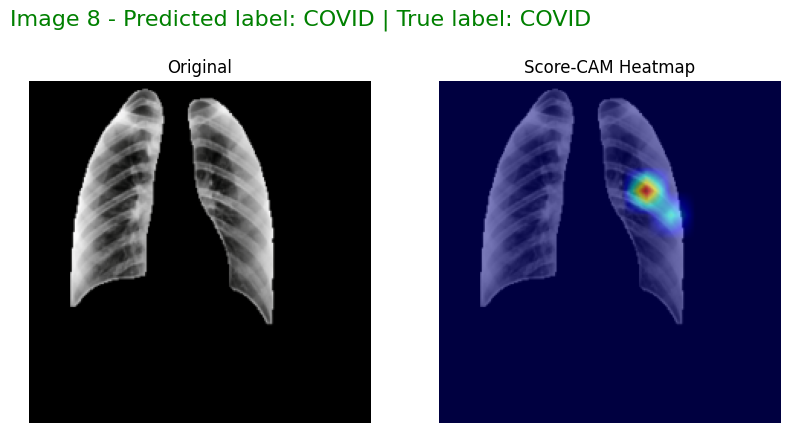

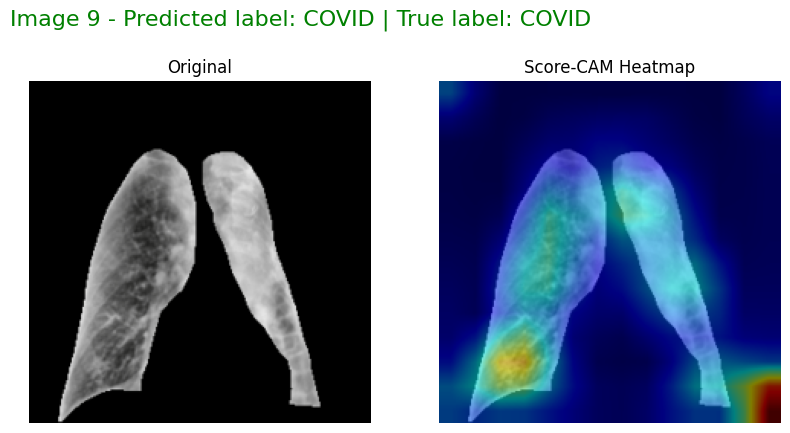

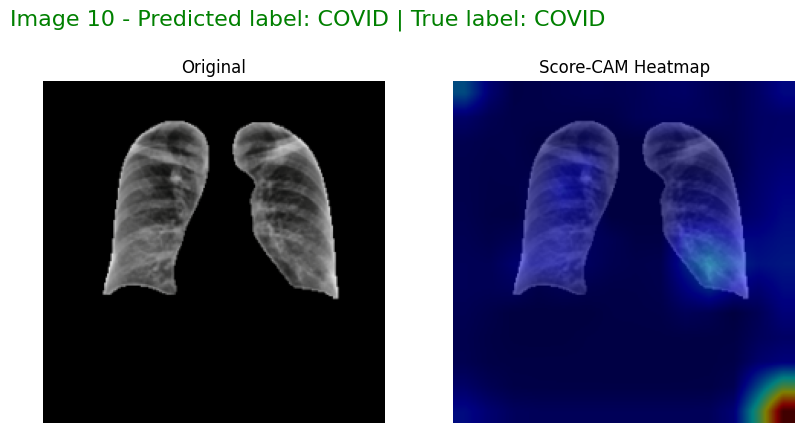

In [54]:
# Visualize the results
apply_model_and_visualize_multiple_images(model, test_loader, class_names, num_images=10)